---

[![Abrir no Google Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ppestana-supervisor/PDI_python/blob/main/topico2/Topico2.ipynb)

> **Nota importante**
>
> Este notebook é carregado diretamente a partir do repositório oficial no GitHub e é apenas para **leitura**.  
> As alterações **não ficam guardadas**.
>
> Para guardar uma versão pessoal:
> - No Colab, ir a **Ficheiro → Guardar uma cópia no Drive**.  
> - A cópia ficará disponível em `O meu Drive / Colab Notebooks`.
>
> Para colaboração:
> - Abrir a versão pessoal no Google Drive.  
> - Clicar em **Partilhar** → **Qualquer pessoa com o link pode editar** (ou adicionar os colegas manualmente).  
> - A partir daí, todos podem editar em tempo real, como num Google Docs.
>
> Para guardar resultados (imagens, ficheiros, etc.) no  Drive:
> ```python
> from google.colab import drive
> drive.mount('/content/drive')
> ```
> Depois gravar, por exemplo, em:
> ```python
> img.save('/content/drive/MyDrive/PDI_outputs/resultado.png')
> ```

---

In [ ]:
### !!! Executar esta célula primeiro, se dentro do Colab
# Quando dentro do Colab, clonar o repositório completo para garantir acesso à pasta de imagens
!git clone https://github.com/ppestana-supervisor/PDI_python.git
%cd PDI_python/topico2

# 2. Filtragem, convolução e domínio espectral

A filtragem é um processo fundamental do **processamento digital de imagem**, responsável por modificar seletivamente o conteúdo espacial ou frequencial. Tem como objetivo **realçar estruturas**, **suprimir ruído** ou **extrair informação**  através de operações locais ou globais que manipulam as intensidades dos pixels.

Do ponto de vista matemático, a filtragem é descrita pela **convolução discreta** — uma operação que combina cada ponto da imagem com a sua vizinhança segundo um conjunto de coeficientes, o **kernel**. Dependendo da escolha do kernel, a imagem pode ser suavizada, acentuada, diferenciada ou transformada.

Este capítulo percorre três níveis complementares de análise:

1. **Filtragem espacial** — aplicação direta de máscaras no domínio da imagem, incluindo filtros de média, mediana e gradiente, e modos de fronteira.

2. **Filtragem no domínio da convolução** — implementação eficiente através de operações vetorizadas e comparação entre abordagens espaciais e espectrais.

3. **Filtragem no domínio de Fourier (espectral / de freuqências)** — transição para o espaço das frequências, onde o filtro atua como uma modulação seletiva do conteúdo espectral da imagem.

Ao compreender a relação entre os domínios espacial e frequencial, o estudante adquire uma visão unificada sobre como **a forma (estrutura)** e **a energia (frequência)** se entrelaçam na formação e modificação das imagens digitais.

            ┌──────────────────────────────┐
            │     Imagem original f(x,y)   │
            └──────────────┬───────────────┘
                           │
                 Filtragem espacial
                           │
                           ▼
            ┌──────────────────────────────┐
            │ Convolução direta com kernel │
            │        g(x,y) = f * w        │
            └──────────────┬───────────────┘
                           │
                 ↕ Equivalência matemática
                           │
                           ▼
            ┌──────────────────────────────┐
            │  Domínio de Fourier (F(u,v)) │
            │  Multiplicação espectral:    │
            │  G(u,v) = F(u,v) · W(u,v)    │
            └──────────────┬───────────────┘
                           │
                   Transformada inversa
                           │
                           ▼
            ┌──────────────────────────────┐
            │  Imagem filtrada g(x,y)      │
            └──────────────────────────────┘

> **Leitura orientada:**  
> O mesmo filtro pode ser visto tanto como **uma convolução no espaço**  
> (média ponderada sobre vizinhanças) ou como **uma multiplicação no espectro de frequências**.  
> Esta dualidade é o núcleo conceptual da filtragem digital de imagens.

Antes de iniciarmos a implementação prática dos filtros, é importante definir o ambiente computacional que iremos utilizar.

As bibliotecas carregadas na célula seguinte fornecem as ferramentas fundamentais para este capítulo:

- **NumPy** — manipulação matricial e operações vetorizadas.  
- **Matplotlib** — visualização e comparação entre imagens.  
- **Pillow (PIL)** — leitura e escrita de ficheiros de imagem.  
- **SciPy** — implementação otimizada de convoluções e transformadas.  
- **scikit-image** — conjunto de filtros e transformações de alto nível (gabor, gaussian, unsharp, etc.).  
- **tqdm** — barra de progresso para ciclos demorados.  
- **time** — medição de tempos de execução.

Com estas bibliotecas, estabelecemos a ponte entre os conceitos teóricos (convolução, filtragem, transformada de Fourier) e a sua implementação prática em Python.

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import time

from PIL import Image
from scipy.fftpack import dct, idct
from scipy.ndimage import convolve
from scipy.ndimage import generic_filter
from scipy.signal import fftconvolve
from skimage.filters import gabor
from skimage.filters import gaussian, unsharp_mask, laplace
from skimage.filters import median
from skimage.filters import unsharp_mask
from skimage.morphology import square
from skimage.morphology import footprint_rectangle
from skimage.transform import resize
from skimage.util import random_noise
from tqdm.notebook import tqdm

## 2.1 Filtragem espacial

A filtragem espacial é a operação fundamental do processamento digital de imagens. Consiste em calcular, para cada píxel, uma soma ponderada das intensidades na sua vizinhança segundo um conjunto de coeficientes designado *filtro* ou *kernel*.

Matematicamente, a operação de filtragem (ou convolução discreta) é dada por:

$$
g(x, y) = \sum_{i=-a}^{a} \sum_{j=-b}^{b} w(i,j)\, f(x - i,\, y - j)
$$

onde:  
- $f(x, y)$ é a imagem original,  
- $w(i, j)$ é o kernel de dimensões $(2a+1)\times(2b+1)$,  
- $g(x, y)$ é a imagem resultante após a filtragem.

Cada valor de $g(x, y)$ resulta da multiplicação elemento a elemento entre a vizinhança local de $f$ e o kernel $w$, seguida da soma dos produtos.

> **Nota conceptual**  
> Em processamento digital, a distinção entre *filtragem* e *convolução* é essencialmente formal.  
> A convolução implica a inversão do kernel ($w(i,j) \to w(-i,-j)$), enquanto a filtragem direta pode omitir essa inversão.  
> Para kernels simétricos (o mais típico), ambas produzem o mesmo resultado.

### 2.1.1 Descrição sequencial da operação

1. A imagem é carregada a partir de ficheiro, convertida para tons de cinza e transformada num `array` NumPy de precisão `float`. Este formato permite realizar operações aritméticas contínuas.

2. Define-se o tamanho do kernel ($k_{\text{size}} = 5$) e constrói-se uma matriz $w$ de dimensão $5\times5$, com todos os elementos iguais a $\frac{1}{25}$, de modo a que a soma total seja igual a 1. Este é um filtro de média uniforme, e suaviza a imagem.

3. Cria-se uma matriz de saída $g$ com as mesmas dimensões da imagem de entrada, inicialmente preenchida com zeros. Esta matriz armazenará o resultado da filtragem.

4. O programa percorre a imagem linha a linha e coluna a coluna, ignorando as margens onde o kernel não cabe integralmente. Em cada posição $(i, j)$, extrai-se a vizinhança local de $f$ e calcula-se o produto elemento a elemento com o kernel $w$, somando os resultados para obter $g(i, j)$.

5. O valor obtido é armazenado na posição correspondente da imagem filtrada. Este processo é repetido para todos os píxeis do domínio válido, completando a convolução 2D.

6. A imagem resultante é reconvertida para o tipo `uint8` (valores entre 0 e 255) para visualização. Em seguida, são apresentadas lado a lado a imagem original e a filtrada.

### 2.1.2 Interpretação e observações

O filtro de média produz um desfoque global (blur), atenuando variações locais e reduzindo o ruído de alta frequência. Como todos os coeficientes têm o mesmo peso, cada píxel passa a representar a média das intensidades na vizinhança quadrada definida.

> **Nota prática**  
> Recomenda-se experimentar diferentes tamanhos de kernel (`k_size = 3`, `5`, `9`, …) e observar o efeito sobre o detalhe da imagem.  
> À medida que o tamanho aumenta, a suavização torna-se mais pronunciada e os contornos perdem nitidez.  
> É fundamental garantir que a soma dos coeficientes de $w$ seja igual a 1, de modo a preservar o brilho médio da imagem.


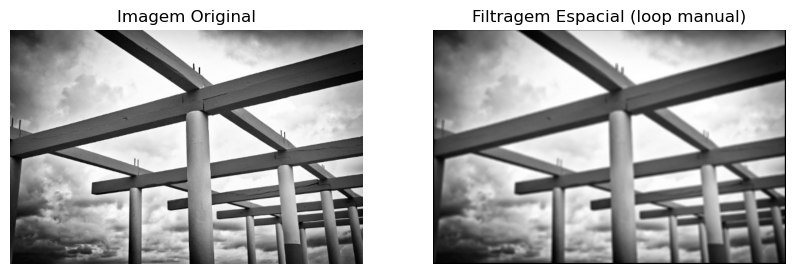

In [2]:
img = Image.open("imgs/img_5.jpg").convert("L")
img = np.array(img, dtype=float)

k_size = 5
kernel = np.ones((k_size, k_size)) / (k_size ** 2)

in_pad = k_size // 2

img_filt = np.zeros_like(img)

for i in range(in_pad, img.shape[0] - in_pad):
    for j in range(in_pad, img.shape[1] - in_pad):
        pixel_val = 0.0
        for g in range(-in_pad, in_pad + 1):
            for h in range(-in_pad, in_pad + 1):
                pixel_val += kernel[g + in_pad, h + in_pad] * img[i + g, j + h]
        img_filt[i, j] = pixel_val

img_filt = img_filt.astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(img_filt, cmap="gray")
axes[1].set_title("Filtragem Espacial (loop manual)")
axes[1].axis("off")

plt.show()

## 2.2 Filtro de média (biblioteca)

Um filtro espacial com todos os elementos idênticos — *filtro de média* — produz um desfoque uniforme na imagem. Enquanto a implementação anterior executava manualmente a convolução através de ciclos dentro de ciclos, nesta etapa utiliza-se uma função otimizada da biblioteca `scipy.ndimage` que realiza a mesma operação de forma vetorizada e eficiente.

A função `convolve()` é o equivalente direto da `imfilter` do MATLAB. Aplica o kernel especificado sobre a imagem, calculando a média ponderada de cada vizinhança.

### 2.2.1 Descrição sequencial da operação

1. A imagem é carregada a partir do ficheiro e convertida para escala de cinza, sendo depois representada como `array` NumPy de precisão `float`. Este formato permite operações matemáticas contínuas.

2. Define-se o tamanho do kernel ($k_{\text{size}} = 21$) e cria-se a matriz $w$ com dimensões $21\times21$, preenchida com valores iguais a $\frac{1}{441}$. Esta normalização assegura que a soma total de $w$ é igual a 1, preservando o brilho médio da imagem.

3. A função `convolve(img, kernel, mode="reflect")` aplica o filtro de média, refletindo a imagem nas arestas para evitar artefactos. Cada píxel resultante representa a média local de uma vizinhança quadrada centrada nesse ponto.

4. O resultado é recortado ao intervalo [0, 255] com `np.clip()` e convertido para o tipo `uint8` para permitir a visualização.

5. As duas imagens — original e filtrada — são apresentadas lado a lado, permitindo comparar diretamente o efeito de suavização.

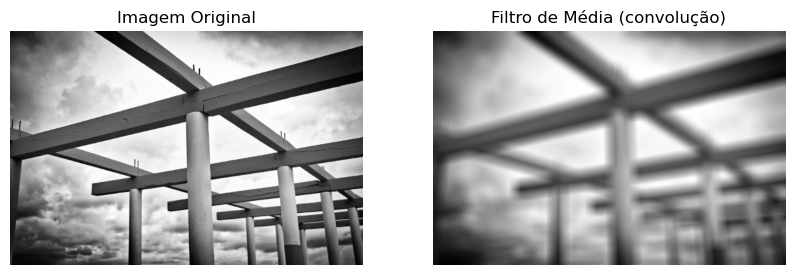

In [3]:
k_size = 21
kernel = np.ones((k_size, k_size)) / (k_size ** 2)

img = Image.open("imgs/img_5.jpg").convert("L")
img = np.array(img, dtype=float)

img_filt = convolve(img, kernel, mode="reflect")

img_filt = np.clip(img_filt, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(img_filt, cmap="gray")
axes[1].set_title("Filtro de Média (convolução)")
axes[1].axis("off")

plt.show()

## 2.3 Modos de fronteira na filtragem espacial

A função `convolve()` do módulo `scipy.ndimage` permite especificar o modo como as arestas da imagem são tratadas durante a filtragem. Nas regiões próximas das margens, parte do kernel fica fora do domínio da imagem, sendo necessário definir uma convenção para lidar com essa ausência de dados.

As opções mais comuns correspondem diretamente às da função `imfilter` do MATLAB:

| `mode` | Descrição | Equivalente MATLAB |
|:-------|:-----------|:------------------|
| `"constant"` | Preenche com zeros fora dos limites da imagem | zero-padding |
| `"nearest"`  | Repete o valor do píxel mais próximo | replicate |
| `"reflect"`  | Reflete a imagem em espelho nas arestas | symmetric |
| `"wrap"`     | Faz a imagem repetir-se ciclicamente | circular |

A escolha do modo afeta significativamente o resultado visual da filtragem, sobretudo em imagens pequenas ou com elevado contraste junto às arestas.

### 2.3.1 Descrição sequencial da operação

1. Constrói-se uma pequena imagem binária tipo xadrez (matriz $2\times2$) e amplia-se para $100\times100$ pixels com `resize(..., order=0)`, de modo a preservar os blocos quadrados sem interpolação.
2. Define-se um kernel de média $15\times15$, com soma igual a 1, que irá suavizar a transição entre as zonas claras e escuras.
3. Aplica-se a função `convolve()` quatro vezes sobre a mesma imagem, variando o parâmetro `mode` entre `"constant"`, `"nearest"`, `"reflect"` e `"wrap"`.
4. Cada resultado é representado numa grelha 2×2 de subplots, permitindo comparar visualmente o comportamento de cada modo de fronteira.

### 2.3.2 Interpretação e observações

O modo de fronteira define como a convolução é calculada nas margens, onde o kernel não encontra vizinhança completa. Os efeitos visuais são distintos:

- **`constant` (zero-pad):** produz uma zona escura junto às arestas, pois as regiões fora da imagem são consideradas nulas.  
- **`nearest` (replicate):** mantém a intensidade do píxel mais próximo, resultando em arestas estáveis mas pouco naturais.  
- **`reflect` (symmetric):** gera uma transição suave e contínua; é a escolha mais comum em filtragem espacial.  
- **`wrap` (circular):** liga as arestas opostas da imagem, útil apenas em imagens com periodicidade.

> **Nota prática**  
> É recomendável experimentar diferentes modos e observar o impacto visual no desfoque.  
> Para a maioria das aplicações, o modo `"reflect"` oferece o melhor equilíbrio entre continuidade e ausência de artefactos, sendo a opção por defeito nas bibliotecas modernas de processamento de imagem.


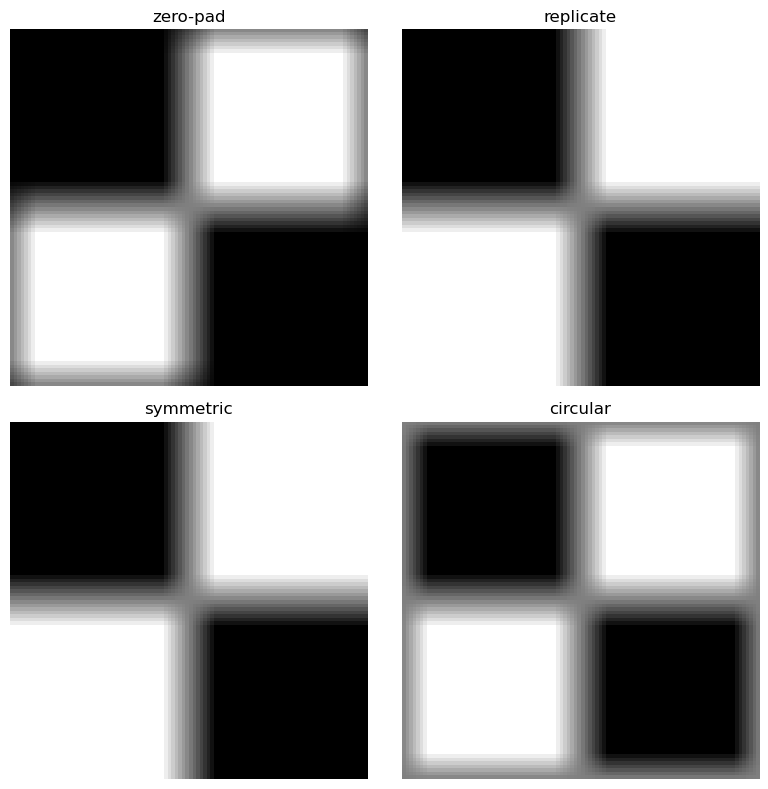

In [4]:
f = np.array([[0, 1],
              [1, 0]], dtype=float)
f = resize(f, (100, 100), order=0, anti_aliasing=False)

w_size = 15
w = np.ones((w_size, w_size)) / (w_size ** 2)

g1 = convolve(f, w, mode="constant", cval=0.0)   # zero-pad (padrão)
g2 = convolve(f, w, mode="nearest")              # replicate
g3 = convolve(f, w, mode="reflect")              # symmetric
g4 = convolve(f, w, mode="wrap")                 # circular

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.ravel()

titles = ["zero-pad", "replicate", "symmetric", "circular"]
images = [g1, g2, g3, g4]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap="gray", vmin=0, vmax=1)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

## 2.4 Filtro de Blur Gaussiano

O filtro Gaussiano é uma das formas mais elegantes e eficazes de suavização de imagem.  
Em vez de aplicar uma média uniforme, utiliza um conjunto de pesos definidos por uma distribuição Gaussiana bidimensional, o que confere maior importância aos píxeis próximos do centro e menor aos mais afastados.

Matematicamente, o kernel Gaussiano de desvio padrão $\sigma$ e tamanho $N\times N$ é dado por:

$$
w(x,y) = \frac{1}{2\pi\sigma^2} \, e^{-\frac{x^2 + y^2}{2\sigma^2}}
$$

A convolução da imagem $f(x,y)$ com este kernel produz uma versão suavizada $g(x,y)$ que elimina o ruído de alta frequência sem introduzir as quebras abruptas características dos filtros uniformes.

### 2.4.1 Descrição sequencial da operação

1. A imagem é lida a partir do ficheiro, convertida para escala de cinza e representada como `array` NumPy de precisão `float`. Este formato permite a aplicação direta de operações contínuas.

2. Define-se o valor de $\sigma$, que controla a extensão do desfoque: quanto maior $\sigma$, mais ampla é a vizinhança efetiva do filtro e maior a suavização. O tamanho do kernel $N$ é calculado como $N = 6\sigma + 1$ para incluir aproximadamente três desvios padrão em cada direção.

3. Utiliza-se a função `gaussian()` do módulo `skimage.filters`, que aplica automaticamente a convolução com o kernel Gaussiano normalizado, usando o modo de fronteira `"reflect"` para evitar artefactos.

4. O resultado é recortado ao intervalo [0, 255] e convertido para `uint8` para visualização. São apresentadas lado a lado a imagem original e a filtrada, permitindo observar a diferença de suavização em relação ao filtro de média.

### 2.4.2 Interpretação e observações

O filtro Gaussiano é um filtro *passa-baixo* isotrópico, ou seja, atenua igualmente as variações de intensidade em todas as direções. A sua resposta é suave e contínua, evitando o efeito de “borrão quadrado” típico da média uniforme.

O parâmetro $\sigma$ atua como um controlo direto da escala de observação: valores pequenos preservam detalhes finos, enquanto valores grandes produzem imagens cada vez mais suaves e homogéneas.

> **Nota prática**  
> Recomenda-se experimentar diferentes valores de $\sigma$ (por exemplo, 1, 3, 5, 10) para compreender como a largura da função Gaussiana afeta o resultado.  
> O filtro Gaussiano é particularmente útil antes de operações de deteção de contornos ou de subamostragem, pois reduz ruído mantendo a estrutura global da imagem.


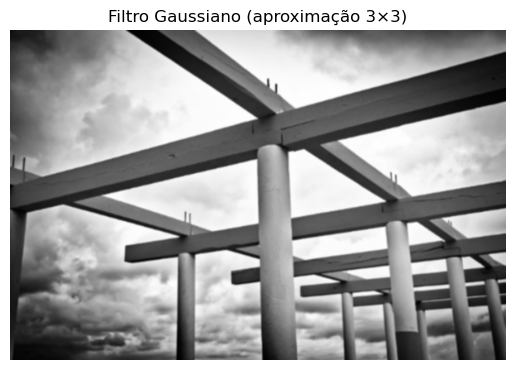

In [5]:
w_gauss = np.array([[1, 2, 1],
                    [2, 4, 2],
                    [1, 2, 1]], dtype=float)
w_gauss = w_gauss / np.sum(w_gauss)

f = Image.open("imgs/img_5.jpg").convert("L")
f = np.array(f, dtype=float)

g = convolve(f, w_gauss, mode="reflect")

g = np.clip(g, 0, 255).astype(np.uint8)

plt.imshow(g, cmap="gray")
plt.title("Filtro Gaussiano (aproximação 3×3)")
plt.axis("off")
plt.show()

## 2.5 Filtros detectores de arestas

Os filtros de Sobel são amplamente utilizados para detetar arestas em imagens, aproximando a ideia de uma derivada discreta nas direções horizontal e vertical.  
Enquanto os filtros de suavização reduzem variações de alta frequência, os detetores de arestas realçam-nas, pois correspondem a transições bruscas de intensidade — tipicamente associadas a contornos de objetos.

Cada kernel de Sobel implementa uma aproximação à primeira derivada da imagem em uma direção específica:

- **Filtro vertical** — responde a variações horizontais de luminosidade (arestas verticais);  
- **Filtro horizontal** — responde a variações verticais de luminosidade (arestas horizontais).

Matematicamente, cada um pode ser representado como:

$$
w_{\text{Sobel},x} =
\begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix},
\quad
w_{\text{Sobel},y} =
\begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$

### 2.5.1 Descrição sequencial da operação

1. A imagem é carregada e convertida para escala de cinza, sendo representada como `array` NumPy de tipo `float`. Este formato permite calcular gradientes com precisão contínua.

2. Definem-se os dois kernels de Sobel — vertical e horizontal — conforme as matrizes anteriores.

3. Aplica-se a convolução de cada kernel sobre a imagem, com o modo de fronteira `"reflect"` para evitar artefactos junto às arestas.

4. Os resultados são limitados ao intervalo [0, 255] e convertidos para o tipo `uint8` para visualização.

5. As imagens resultantes — uma para o gradiente vertical e outra para o horizontal — são apresentadas lado a lado.  
   Juntas, mostram as direções predominantes de variação da intensidade luminosa.

### 2.5.2 Interpretação e observações

Os filtros de Sobel correspondem a detetores de gradiente, ou seja, aproximam a derivada da imagem. O valor absoluto do gradiente indica a intensidade da variação local, e o seu sinal distingue transições de claro para escuro das de escuro para claro.

> **Nota prática**  
> É recomendável combinar as duas componentes através da magnitude do gradiente total:
> $$
> G = \sqrt{G_x^2 + G_y^2}
> $$
> Esta operação fornece um mapa único de arestas, independente da orientação.  
> Experimente variar o tamanho do kernel (embora o Sobel clássico use 3×3) ou comparar com outros operadores de derivada, como *Prewitt* ou *Scharr*, que diferem ligeiramente na suavização e sensibilidade direcional.


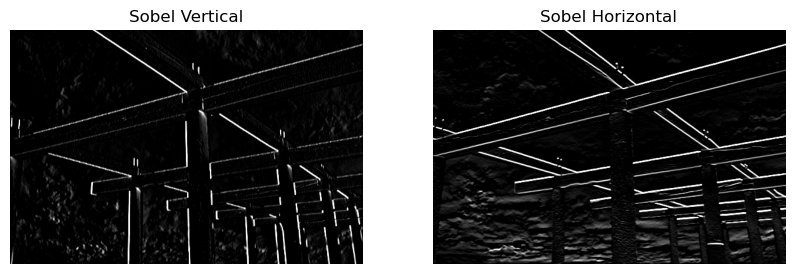

In [6]:
f = Image.open("imgs/img_5.jpg").convert("L")
f = np.array(f, dtype=float)

w_sobel_v = np.array([[-1, 0, 1],
                      [-2, 0, 2],
                      [-1, 0, 1]], dtype=float)

w_sobel_h = np.array([[-1, -2, -1],
                      [ 0,  0,  0],
                      [ 1,  2,  1]], dtype=float)

g_v = convolve(f, w_sobel_v, mode="reflect")
g_h = convolve(f, w_sobel_h, mode="reflect")

g_v = np.clip(g_v, 0, 255).astype(np.uint8)
g_h = np.clip(g_h, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(g_v, cmap="gray")
axes[0].set_title("Sobel Vertical")
axes[0].axis("off")

axes[1].imshow(g_h, cmap="gray")
axes[1].set_title("Sobel Horizontal")
axes[1].axis("off")

plt.show()

## 2.6 Filtro Laplaciano e realce de nitidez

O filtro Laplaciano é uma alternativa simples aos filtros direcionais como o Sobel, pois responde simultaneamente a variações em todas as direções.  
Corresponde à aproximação discreta da **segunda derivada** da imagem e destaca regiões de transição abrupta de intensidade — as arestas.

Existem duas versões comuns:

- **Laplaciano de 4 vizinhos**, que considera apenas as direções principais (horizontal e vertical);
- **Laplaciano de 8 vizinhos**, que inclui também as diagonais, proporcionando uma resposta mais completa.

Os kernels mais utilizados são:

$$
w_{\text{Laplace4}} =
\begin{bmatrix}
0 & 1 & 0 \\
1 & -4 & 1 \\
0 & 1 & 0
\end{bmatrix},
\quad
w_{\text{Laplace8}} =
\begin{bmatrix}
1 & 1 & 1 \\
1 & -8 & 1 \\
1 & 1 & 1
\end{bmatrix}
$$

Como a soma dos coeficientes é igual a zero, o resultado do filtro tende a ser centrado em torno de tons médios, com valores positivos e negativos distribuídos em torno das zonas de contorno.

### 2.6.1 Descrição sequencial da operação

1. A imagem é carregada, convertida para tons de cinzento e representada como `array` NumPy de precisão `float`.

2. Definem-se as duas máscaras Laplacianas — uma de 4 vizinhos e outra de 8 vizinhos — conforme as matrizes acima.

3. Cada máscara é aplicada por convolução (`convolve`) com o modo `"reflect"`, obtendo duas imagens que evidenciam as transições de intensidade.

4. Em seguida, calcula-se a imagem **realçada** subtraindo o resultado Laplaciano da imagem original:
   $$
   f_{\text{enhanced}} = f - g_{\text{Laplace}}
   $$
   Esta operação corresponde ao método de *unsharp masking* na sua forma mais simples.

5. Os resultados (Laplaciano de 4 vizinhos, de 8 vizinhos e imagem realçada) são convertidos para `uint8` e apresentados lado a lado.

### 2.6.2 Interpretação e observações

O filtro Laplaciano é sensível a variações bruscas de intensidade, funcionando como um **detetor de arestas isotrópico** (sem direção preferencial).  
Enquanto os filtros de Sobel distinguem orientação, o Laplaciano realça todas as arestas simultaneamente.

A subtração do resultado Laplaciano à imagem original aumenta a nitidez — reforça as altas frequências correspondentes às arestas — mas também pode amplificar o ruído se este estiver presente.

> **Nota prática**  
> Recomenda-se experimentar a diferença entre o Laplaciano de 4 e de 8 vizinhos, observando a extensão e intensidade das arestas realçadas.  
> O método de *unsharp masking* pode ser ajustado através de um fator de ganho $k$:
> $$
> f_{\text{sharpened}} = f - k \, g_{\text{Laplace}}
> $$
> Valores de $k$ entre 0.2 e 1 produzem aumentos de nitidez progressivos.  
> O Laplaciano é especialmente útil como etapa preparatória para operações de segmentação e deteção de contornos.


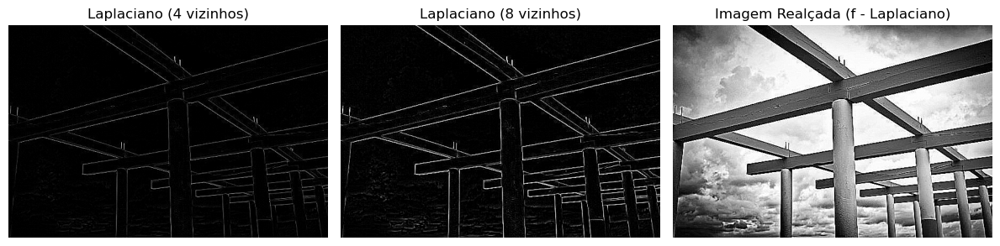

In [7]:
f = Image.open("imgs/img_5.jpg").convert("L")
f = np.array(f, dtype=float)

w_laplace = np.array([[0,  1,  0],
                      [1, -4,  1],
                      [0,  1,  0]], dtype=float)

w_laplace2 = np.array([[1,  1,  1],
                       [1, -8,  1],
                       [1,  1,  1]], dtype=float)

g1 = convolve(f, w_laplace, mode="reflect")
g2 = convolve(f, w_laplace2, mode="reflect")

f_enhanced = f - g2
f_enhanced = np.clip(f_enhanced, 0, 255).astype(np.uint8)

g1 = np.clip(g1, 0, 255).astype(np.uint8)
g2 = np.clip(g2, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(g1, cmap="gray")
axes[0].set_title("Laplaciano (4 vizinhos)")
axes[0].axis("off")

axes[1].imshow(g2, cmap="gray")
axes[1].set_title("Laplaciano (8 vizinhos)")
axes[1].axis("off")

axes[2].imshow(f_enhanced, cmap="gray")
axes[2].set_title("Imagem Realçada (f - Laplaciano)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 2.7 Geração de funções e filtros separáveis

A função `fspecial` do MATLAB gera automaticamente os kernels de alguns dos filtros espaciais mais utilizados. Em Python, funções equivalentes estão disponíveis nos módulos `skimage.filters` e `scipy.ndimage`.  Estas permitem criar filtros Gaussianos, Laplacianos e de realce (*unsharp masking*) de forma parametrizável e coerente.

A principal vantagem em gerar os filtros programaticamente é a possibilidade de controlar de forma precisa os parâmetros — por exemplo, o desvio padrão $\sigma$ num filtro Gaussiano ou o fator de ganho $\alpha$ num filtro Laplaciano — sem necessidade de definir manualmente as matrizes de convolução.

### 2.7.1 Descrição sequencial da operação

1. A imagem é carregada e convertida para escala de cinza, sendo representada como matriz `float` de dimensão $(M, N)$.

2. Aplicam-se sucessivamente três tipos de filtros:
   - **Filtro Gaussiano:** suaviza a imagem, sendo controlado pelo parâmetro $\sigma$ (`sigma=0.5` e `sigma=3` neste exemplo).  
   - **Filtro Laplaciano:** realça variações abruptas de intensidade, funcionando como detetor de arestas de segunda ordem (`laplace(f)` e `0.8*laplace(f)`).
   - **Filtro Unsharp:** combina suavização e subtração, reforçando contornos e aumentando a nitidez (`unsharp_mask(f, radius=1, amount=...)`).


3. Cada resultado é convertido para o intervalo [0, 255] e apresentado em grelha 3×2, permitindo comparar o efeito dos diferentes parâmetros.

### 2.7.2 Interpretação e observações

Os filtros apresentados nesta secção são exemplos clássicos de **operações lineares e separáveis** no domínio espacial.

- O **filtro Gaussiano** atua como um passa-baixo, reduzindo ruído e detalhe fino. Aumentar $\sigma$ conduz a uma suavização mais ampla.
- O **filtro Laplaciano** é um passa-alto, destacando arestas e transições rápidas. Multiplicar a sua saída por um fator $\alpha$ controla a intensidade do realce.
- O **filtro Unsharp Mask** combina os dois efeitos: primeiro suaviza, depois subtrai o resultado da imagem original, realçando os contornos e aumentando a nitidez aparente.

> **Nota prática**  
> Estes três filtros são complementares e podem ser combinados em pipelines de pré-processamento.  
> O Gaussiano é ideal como etapa inicial de suavização antes de deteção de contornos;  
> o Laplaciano pode ser usado para realce controlado;  
> o Unsharp Mask é útil em situações em que se pretende melhorar a nitidez visual sem alterar globalmente o contraste.  
> Recomenda-se variar os parâmetros `sigma`, `alpha` e `amount` para compreender como cada um influencia o resultado final.


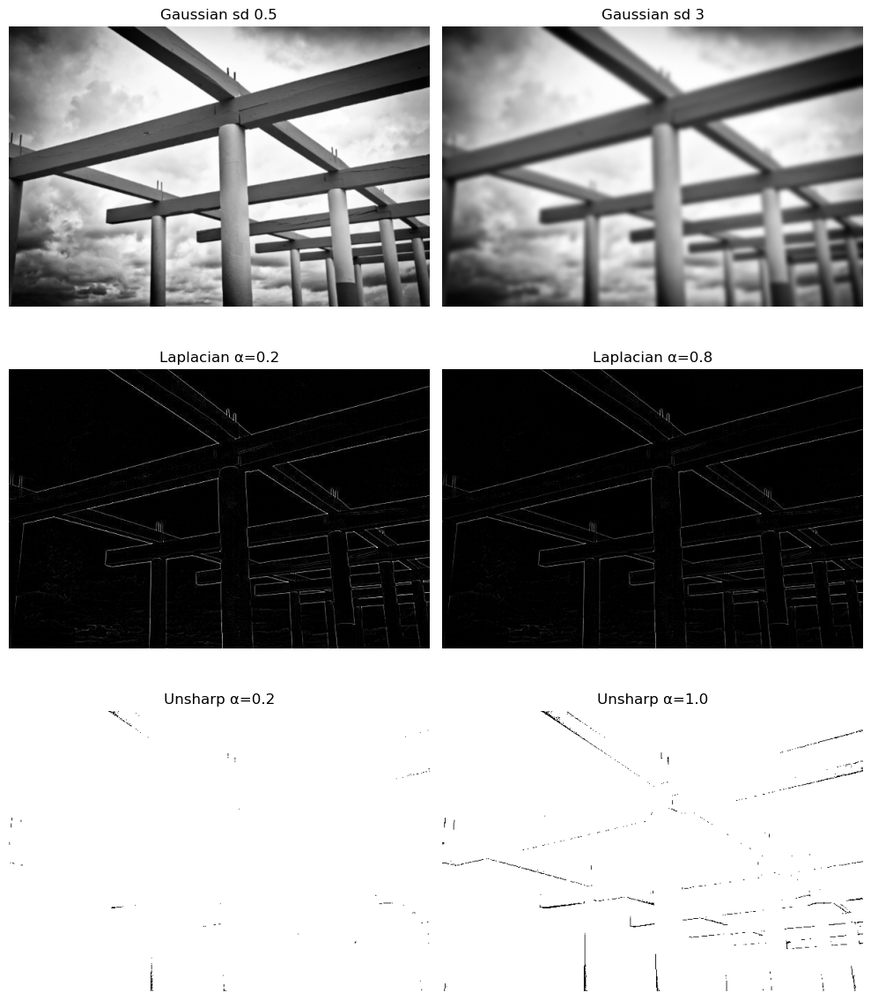

In [8]:
f = Image.open("imgs/img_5.jpg").convert("L")
f = np.array(f, dtype=float)

g1 = gaussian(f, sigma=0.5, mode="reflect")
g2 = gaussian(f, sigma=3, mode="reflect")

lap1 = laplace(f)
lap2 = 0.8 * laplace(f)

u1 = unsharp_mask(f, radius=1, amount=0.2)
u2 = unsharp_mask(f, radius=1, amount=1.0)

def to_uint8(img):
    return np.clip(img, 0, 255).astype(np.uint8)

images = [g1, g2, lap1, lap2, u1, u2]
titles = ["Gaussian sd 0.5", "Gaussian sd 3",
          "Laplacian α=0.2", "Laplacian α=0.8",
          "Unsharp α=0.2", "Unsharp α=1.0"]

fig, axes = plt.subplots(3, 2, figsize=(10, 12))
for ax, img, title in zip(axes.ravel(), images, titles):
    ax.imshow(to_uint8(img), cmap="gray")
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

## 2.8 Filtros separáveis e eficiência de convolução

A convolução 2D direta com filtros grandes é uma operação intensiva em termos computacionais. Para uma imagem de dimensão $(M \times N)$ e um kernel de dimensão $(K \times K)$, o número de multiplicações aproxima-se de $M \times N \times K^2$. Quando o kernel é grande (por exemplo, Gaussiano com centenas de píxeis), o custo torna-se rapidamente proibitivo.

Determinados filtros, como o Gaussiano, são **separáveis**, o que significa que o seu kernel 2D pode ser decomposto no produto externo de dois vetores 1D:

$$
w(x,y) = g(x) \, g(y)
$$

Esta propriedade permite substituir uma única convolução 2D por duas convoluções 1D sucessivas — uma ao longo das linhas e outra ao longo das colunas — reduzindo a complexidade para $2MNK$, com ganho de eficiência substancial.

### 2.8.1 Descrição sequencial da operação

1. A imagem é carregada e convertida para escala de cinza (`float`), sendo depois redimensionada para reduzir o tempo de execução durante as demonstrações. São apresentadas as dimensões original e reduzida.

2. Define-se um kernel Gaussiano grande (321×321) com desvio padrão $\sigma = 60$. Constrói-se o vetor 1D `gauss_1d` e o kernel 2D `w` através do produto externo (`np.outer`).

3. Implementam-se quatro variantes de convolução:

   - **(a)** Convolução 2D linha a linha (*loop explícito*) com barra de progresso — demonstração didática mas ineficiente.  
   - **(b)** Convolução 2D direta — cálculo otimizado, mas ainda exigente em tempo.  
   - **(c)** Convolução separável — aplica duas convoluções 1D sucessivas, explorando a separabilidade do filtro Gaussiano.  
   - **(d)** Convolução via FFT — executa o processo no domínio da frequência, transformando convoluções em multiplicações espectrais.

4. Cada método é temporizado com `time.time()` e os resultados são apresentados juntamente com os tempos medidos em segundos.

5. As três imagens finais (convolução direta, separável e FFT) são exibidas lado a lado para confirmar a equivalência visual dos resultados.

### 2.8.2 Interpretação e observações

A convolução separável reduz drasticamente o tempo de processamento mantendo o mesmo resultado numérico da convolução 2D completa. A abordagem FFT é ainda mais eficiente para kernels muito grandes, pois a complexidade passa de $O(K^2)$ para $O(\log K)$ no domínio da frequência.

> **Nota prática**  
> A separabilidade é uma propriedade exclusiva de certas funções, como a Gaussiana, que podem ser decompostas em fatores 1D independentes.  
> Para filtros não separáveis, a convolução 2D direta ou a versão FFT continuam a ser as únicas alternativas corretas.  
> Recomenda-se comparar os tempos obtidos com `size` e `sigma` diferentes para compreender a relação entre dimensão do kernel, custo computacional e fidelidade visual.


Dimensão original: (4024, 6048)
Dimensão reduzida: (403, 605)
A executar convolução 2D linha a linha (demonstração)...


Convolving (linha a linha):   0%|          | 0/403 [00:00<?, ?it/s]

A executar convolução 2D direta...
A executar convolução separável (linha + coluna)...
A executar convolução via FFT...

⏱ Tempos de execução:
Convolução com barra de progresso (linha a linha): 104.72 s
Convolução 2D direta:                              114.83 s
Convolução separável (linha + coluna):             0.18 s
Convolução FFT:                                    0.01 s


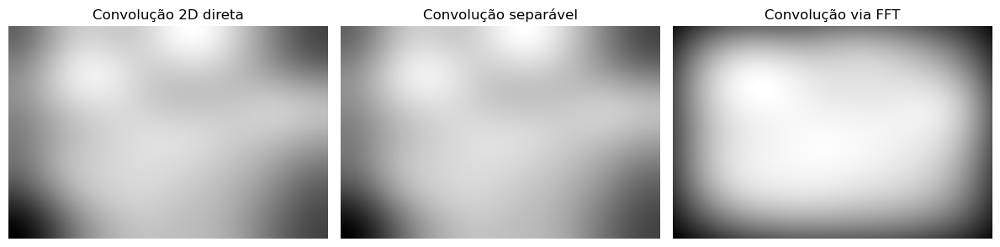

In [9]:
f = Image.open("imgs/original.tif").convert("L")
f = np.array(f, dtype=float)

print(f"Dimensão original: {f.shape}")
f = f[::10, ::10]  # reduzir resolução para 1/10 em ambas as direções
print(f"Dimensão reduzida: {f.shape}")

size = 321
sigma = 60
x = np.linspace(-int(size/2), int(size/2), size)
gauss_1d = np.exp(-0.5 * (x / sigma) ** 2)
gauss_1d /= gauss_1d.sum()
w = np.outer(gauss_1d, gauss_1d)

def convolve_with_progress(img, kernel, mode="reflect"):
    """Convolução linha a linha com barra de progresso."""
    out = np.zeros_like(img)
    for i in tqdm(range(img.shape[0]), desc="Convolving (linha a linha)", leave=False):
        out[i, :] = convolve(img[i:i+1, :], kernel, mode=mode)[0]
    return out

print("A executar convolução 2D linha a linha (demonstração)...")
t0 = time.time()
g_progress = convolve_with_progress(f, w)
t1 = time.time()

print("A executar convolução 2D direta...")
t2 = time.time()
g_full = convolve(f, w, mode="reflect")
t3 = time.time()

print("A executar convolução separável (linha + coluna)...")
t4 = time.time()
g_sep = convolve(convolve(f, gauss_1d[np.newaxis, :], mode="reflect"),
                 gauss_1d[:, np.newaxis], mode="reflect")
t5 = time.time()

print("A executar convolução via FFT...")
t6 = time.time()
g_fft = fftconvolve(f, w, mode="same")
t7 = time.time()

print("\n⏱ Tempos de execução:")
print(f"Convolução com barra de progresso (linha a linha): {t1 - t0:.2f} s")
print(f"Convolução 2D direta:                              {t3 - t2:.2f} s")
print(f"Convolução separável (linha + coluna):             {t5 - t4:.2f} s")
print(f"Convolução FFT:                                    {t7 - t6:.2f} s")

images = [g_full, g_sep, g_fft]
titles = ["Convolução 2D direta", "Convolução separável", "Convolução via FFT"]

fig, axes = plt.subplots(1, 3, figsize=(12, 5))
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap="gray")
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

## 2.9 Filtros não-lineares

Até agora foram utilizados filtros **lineares**, baseados em multiplicações e somas ponderadas — ou seja, operações que preservam a proporcionalidade entre as intensidades dos píxels. Contudo, há muitas situações em que se pretende modificar a imagem de forma não linear, dependendo da vizinhança de cada píxel de modo mais adaptativo.

Os filtros **não-lineares** operam substituindo o valor de cada píxel por uma função arbitrária aplicada sobre a sua vizinhança local. Em vez de médias ponderadas, podem calcular o **máximo**, o **mínimo**, a **mediana** ou outras estatísticas não lineares, sendo especialmente eficazes em contextos de remoção de ruído impulsivo ou realce seletivo de padrões.

### 2.9.1 Descrição sequencial da operação

1. A imagem é carregada, convertida para escala de cinza e normalizada para o intervalo $[0,1]$, permitindo uma comparação direta entre intensidades relativas.

2. Define-se uma janela local de dimensão $5\times5$, dentro da qual se aplica uma função à vizinhança de cada píxel:
   - **Filtro de mediana**: substitui cada píxel pela mediana local. Reduz eficazmente o ruído impulsivo (*salt-and-pepper*) sem desfocar s.
   - **Filtro de máximo**: substitui cada píxel pelo valor máximo na vizinhança. Realça zonas luminosas e expande áreas claras.

3. As operações são implementadas com `scipy.ndimage.generic_filter`, que permite aplicar funções arbitrárias sobre janelas deslizantes.

4. As imagens resultantes são apresentadas lado a lado com a original, permitindo observar a natureza distinta de cada tipo de filtro.

### 2.9.2 Interpretação e observações

Os filtros não-lineares não preservam a estrutura aditiva da imagem — as intensidades deixam de poder ser combinadas linearmente —, mas ganham robustez a ruído e maior seletividade morfológica.

- O **filtro de mediana** é particularmente útil para eliminar ruído esporádico sem comprometer o detalhe.  
- O **filtro de máximo** (ou o de mínimo) pode ser usado em operações morfológicas básicas como dilatação e erosão, com aplicações em segmentação e deteção de formas.

> **Nota prática**  
> Recomenda-se variar o tamanho da janela (`size`) e comparar os efeitos de diferentes funções (`np.median`, `np.max`, `np.min`).  
> Para imagens com ruído sal e pimenta, a mediana é geralmente a opção mais eficaz.  
> Para realçar brilho ou sombras, os filtros de máximo e mínimo oferecem resultados visuais claros e intuitivos.


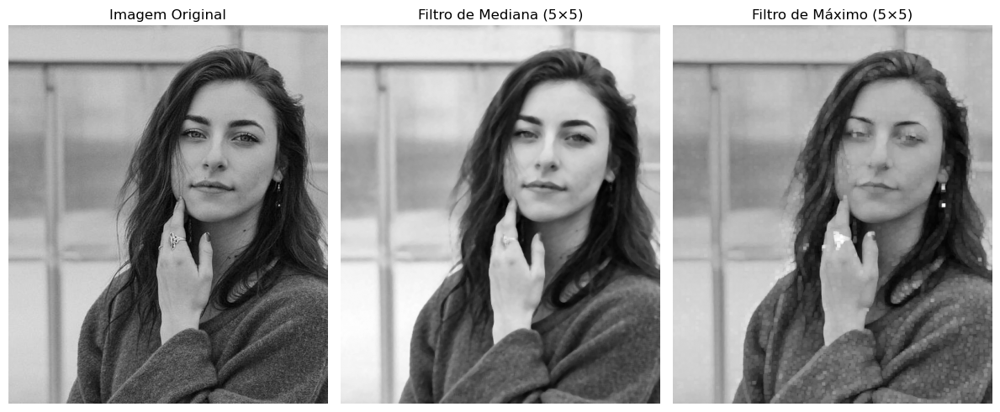

In [10]:
f = Image.open("imgs/humanBW.jpg").convert("L")
f = np.array(f, dtype=float) / 255.0

func_median = np.median
g_median = generic_filter(f, func_median, size=(5, 5), mode="reflect")

func_max = np.max
g_max = generic_filter(f, func_max, size=(5, 5), mode="reflect")

fig, axes = plt.subplots(1, 3, figsize=(12, 5))
axes[0].imshow(f, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(g_median, cmap="gray")
axes[1].set_title("Filtro de Mediana (5×5)")
axes[1].axis("off")

axes[2].imshow(g_max, cmap="gray")
axes[2].set_title("Filtro de Máximo (5×5)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 2.10 Filtro de Mediana

O **filtro de mediana** é um filtro não-linear que substitui cada píxel pela **mediana** das intensidades na sua vizinhança local. Ao contrário da média (linear), a mediana **preserva arestas** e é particularmente robusta a **ruído Sal-e-Pimenta**.

Formalmente, para uma janela $W$ centrada em $(x,y)$:
$$
g(x,y) = \operatorname{median}\,\{\,f(x+i,\; y+j)\;|\; (i,j)\in W \,\}.
$$

### 2.10.1 Descrição sequencial da operação

1. A imagem é carregada, convertida para tons de cinza e **normalizada para $[0,1]$** para facilitar a comparação entre resultados.  

2. **Simula-se ruído Sal-e-Pimenta** com uma fração de píxeis corrompidos (por exemplo, `amount = 0.2`). 

3. **Aplica-se o filtro de mediana** com uma janela quadrada $3\times3$ (footprint $3\times3$), que substitui cada píxel ruidoso pela mediana da vizinhança, atenuando outliers sem desfocar s.  

4. **Visualizam-se lado a lado**: a imagem original, a imagem com ruído e o resultado após a mediana, para inspeção do efeito.

### 2.10.2 Interpretação e observações

- A mediana **remove impulsos isolados** com mínima perda de detalhe local; por isso, supera a média em cenários de Sal-e-Pimenta.  
- Janelas maiores ($5\times5$, $7\times7$) **aumentam a robustez** à contaminação, mas podem **nivelar texturas finas** e estreitar contornos.  
- O tratamento de fronteira por reflexão (modo `"reflect"`) evita descontinuidades artificiais junto às s.

> **Nota prática**  
> – Recomenda-se experimentar diferentes tamanhos de janela (`3×3`, `5×5`, `7×7`) e níveis de ruído (`amount = 0.05 … 0.4`).  
> – Compare visualmente a mediana com a **média $3\times3$**: a média esbate arestas; a mediana preserva-as.  
> – Para imagens muito degradadas, aplicar **duas passagens** de mediana de janela pequena pode ser preferível a uma única janela grande.  
> – Se a biblioteca emitir aviso de depreciação do *footprint* quadrado, substitua por um *footprint* equivalente (retangular) mantendo $3\times3$.


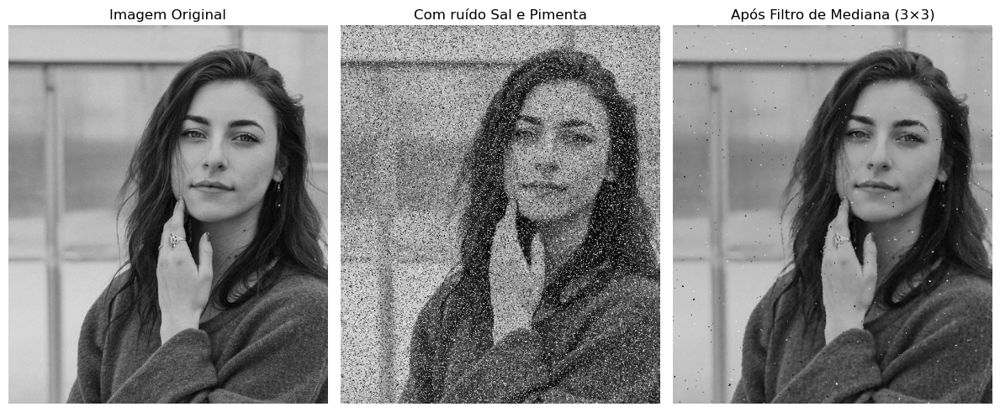

In [29]:
f = Image.open("imgs/humanBW.jpg").convert("L")
f = np.array(f, dtype=float) / 255.0

f_noisy = random_noise(f, mode="s&p", amount=0.2)

g = median(f_noisy, footprint=footprint_rectangle((3, 3)))

fig, axes = plt.subplots(1, 3, figsize=(12, 5))
axes[0].imshow(f, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(f_noisy, cmap="gray")
axes[1].set_title("Com ruído Sal e Pimenta")
axes[1].axis("off")

axes[2].imshow(g, cmap="gray")
axes[2].set_title("Após Filtro de Mediana (3×3)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 2.11 Filtro Unsharp Mask

O **filtro Unsharp Mask** é uma técnica clássica de **realce de nitidez**. Apesar do nome, o princípio é simples: **subtrai-se** da imagem original uma versão **suavizada** (*blured*) dela própria. O resultado enfatiza variações rápidas de intensidade — isto é, as **s** —, aumentando a nitidez aparente sem distorcer o contraste global.

Matematicamente:
$$
f_{\text{sharpened}} = f + k (f - f_{\text{blurred}})
$$
onde $k$ controla o grau de reforço das altas frequências.

A função `unsharp_mask()` do módulo `skimage.filters` implementa esta operação automaticamente, equivalendo à função `imsharpen` do MATLAB.

### 2.11.1 Descrição sequencial da operação

1. A imagem é carregada e convertida para tons de cinzento, sendo normalizada para o intervalo $[0,1]$.  

2. **Aplica-se o filtro Unsharp Mask** com `radius=2` e `amount=1`, gerando uma versão realçada.  
   - O parâmetro `radius` define a largura da suavização (ou seja, o alcance da média local).  
   - O parâmetro `amount` controla a intensidade do realce — quanto maior, mais pronunciado o contorno.  
   
3. Em seguida, a imagem é **artificialmente desfocada** através de um filtro de média $5\times5$, simulando uma perda de nitidez.  

4. Aplica-se novamente o **Unsharp Mask** à versão desfocada, demonstrando como a técnica pode **recuperar detalhe** de imagens degradadas.  

5. As quatro imagens (original, realçada, desfocada e recuperada) são exibidas lado a lado para comparação direta.

### 2.11.2 Interpretação e observações

- O Unsharp Mask **atua como um filtro passa-alto**, realçando arestas sem alterar o brilho médio da imagem.  
- Valores elevados de `amount` ($>1.5$) podem causar **halos** — contornos brilhantes artificiais —, especialmente junto a transições abruptas.  
- O parâmetro `radius` determina o tipo de detalhe reforçado:
  - valores baixos (1–2) realçam **textura fina** e microdetalhe;
  - valores altos (4–8) atuam sobre **estruturas mais amplas**, produzindo nitidez global.  
- A aplicação a imagens desfocadas é eficaz, mas não substitui a informação perdida por desfoque real — apenas reforça contrastes locais residuais.

> **Nota prática**  
> – Experimente variar `radius` entre 1 e 5 e `amount` entre 0.5 e 2.0 para observar o equilíbrio entre nitidez e artefactos.  
> – Compare visualmente os resultados antes e depois de aplicar o filtro a uma imagem previamente desfocada.  
> – Combine esta técnica com a filtragem Gaussiana: suavizar ligeiramente antes de aplicar o Unsharp Mask pode prevenir halos em imagens com ruído.  
> – Em aplicações de pré-processamento (por exemplo, segmentação), o Unsharp Mask é útil para **melhorar a definição de contornos** sem alterar a morfologia geral.


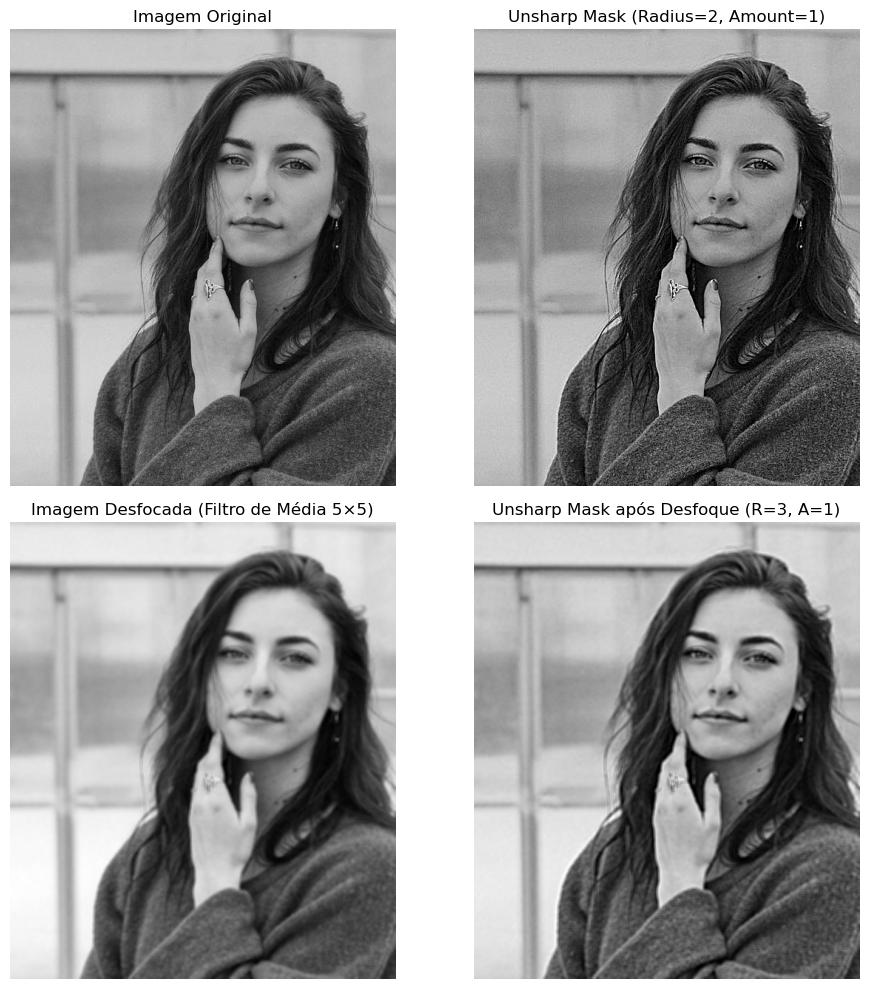

In [12]:
f = Image.open("imgs/humanBW.jpg").convert("L")
f = np.array(f, dtype=float) / 255.0

g = unsharp_mask(f, radius=2, amount=1)

kernel_avg = np.ones((5, 5)) / 25
f_blurry = convolve(f, kernel_avg, mode="reflect")

f_unsharpen = unsharp_mask(f_blurry, radius=3, amount=1)

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.ravel()

axes[0].imshow(f, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(g, cmap="gray")
axes[1].set_title("Unsharp Mask (Radius=2, Amount=1)")
axes[1].axis("off")

axes[2].imshow(f_blurry, cmap="gray")
axes[2].set_title("Imagem Desfocada (Filtro de Média 5×5)")
axes[2].axis("off")

axes[3].imshow(f_unsharpen, cmap="gray")
axes[3].set_title("Unsharp Mask após Desfoque (R=3, A=1)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

## 2.12 Transformada de Fourier

A **Transformada de Fourier** permite analisar uma imagem no **domínio das frequências**, decompondo-a numa soma de ondas sinusoidais e co-sinusoidais.  Cada ponto da transformada representa uma **frequência espacial** (variação de intensidade ao longo da imagem) e a sua **energia associada**. Na prática, usamos a **Transformada Rápida de Fourier (FFT)** através de `np.fft.fft2()`, deslocando o zero-frequência para o centro com `fftshift()`.  
Assim, as **frequências baixas** aparecem no centro do espectro e as **altas frequências** nas margens.

### 2.12.1 Interpretação geral

- A **magnitude** (ou módulo) indica a **energia** das componentes espaciais. É comum visualizá-la em **escala logarítmica**, pois os valores variam por várias ordens de grandeza.  
- A **fase** contém a informação estrutural da imagem — a disposição das formas, arestas e texturas.  
- As **partes real e imaginária** têm menos valor interpretativo isoladamente, mas a sua combinação permite reconstruir a imagem original.

### 2.12.2 Descrição sequencial da operação

1. **Define-se uma função auxiliar `plotFFT()`** que executa e representa a FFT 2D de uma imagem.  
   A função mostra:
   - a imagem original,  
   - as partes **real** e **imaginária**,  
   - a **fase**,  
   - a **magnitude**,  
   - e a **magnitude logarítmica deslocada** (com `fftshift`).  
   Este layout reproduz o comportamento clássico do MATLAB (`fft2` e `imshow(..., [])`).

2. **Aplica-se primeiro a FFT a uma matriz artificial $4\times4$**, com blocos de intensidade distinta (“duotone”). Este exemplo ajuda a perceber a natureza **periódica** da FFT — pequenas estruturas espaciais correspondem a **frequências altas**, e zonas uniformes a **frequências baixas**.

3. **Aplica-se depois a FFT a uma imagem real**, mostrando a típica **concentração de energia no centro** do espectro.  
   A imagem real apresenta um padrão onde:
   - as baixas frequências dominam o centro (informação global e luminância);  
   - as altas frequências surgem como pontos e padrões dispersos nas margens (arestas, texturas e ruído).

### 2.12.3 Leitura e interpretação dos resultados

- No espectro de magnitude, as regiões claras correspondem a frequências com maior energia. É normal observar um núcleo central intenso, sinal de que a maior parte da informação é **de baixa frequência**.  
- O mapa de fase parece visualmente caótico, mas é **essencial para a reconstrução fiel** da imagem — contém toda a informação sobre posição e forma.  
- A magnitude sozinha não é suficiente para reconstruir a imagem original; a fase contém a estrutura espacial.

### 2.12.4 Observações adicionais

- A Transformada de Fourier é **linear** e **invertível**: aplicar `ifft2()` sobre o espectro completo recupera exatamente a imagem original.  
- Pequenas variações numéricas entre FFT e IFFT são devidas à precisão de ponto flutuante.  
- A visualização deve ajustar o contraste (`vmin`, `vmax`) ou usar `np.log(1 + |F|)` para evitar saturação.  
- Para imagens coloridas, a FFT deve ser aplicada **a cada canal** separadamente — ver secção 2.23.

> **Nota prática**  
> – Explore o impacto de diferentes padrões: crie matrizes pequenas com linhas ou quadrados e observe a simetria no espectro.  
> – Use `np.fft.ifft2()` para confirmar que a imagem se reconstrói integralmente a partir da magnitude e fase.  
> – Compare espectros de imagens com texturas (alta frequência) e imagens suaves (baixa frequência).  
> – Tente aplicar `fftshift()` e `ifftshift()` manualmente para perceber como o deslocamento do centro afeta a leitura dos espectros.


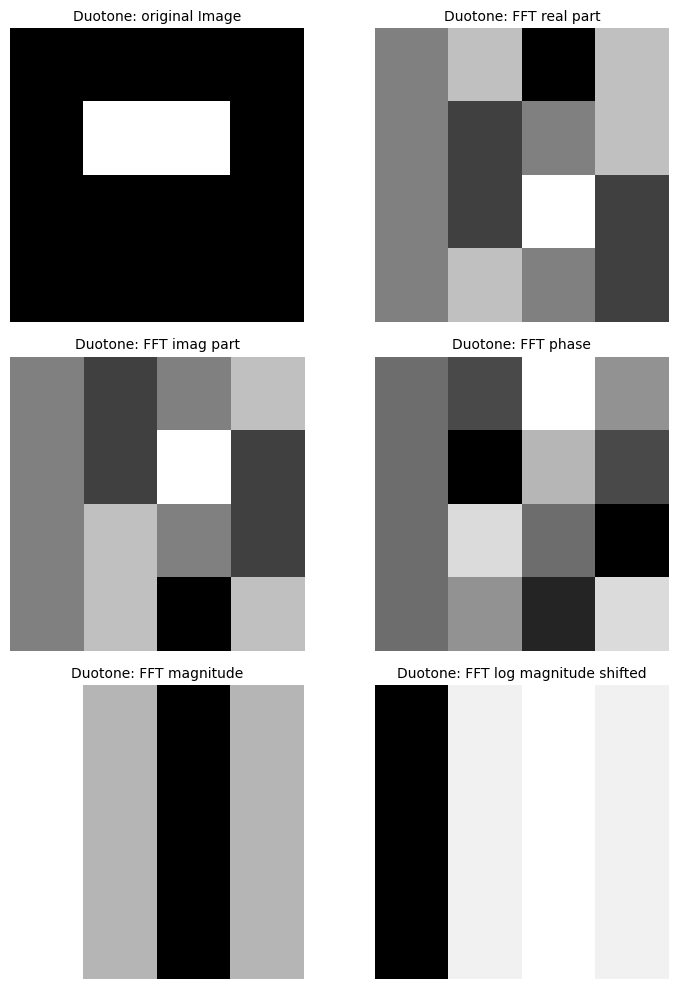

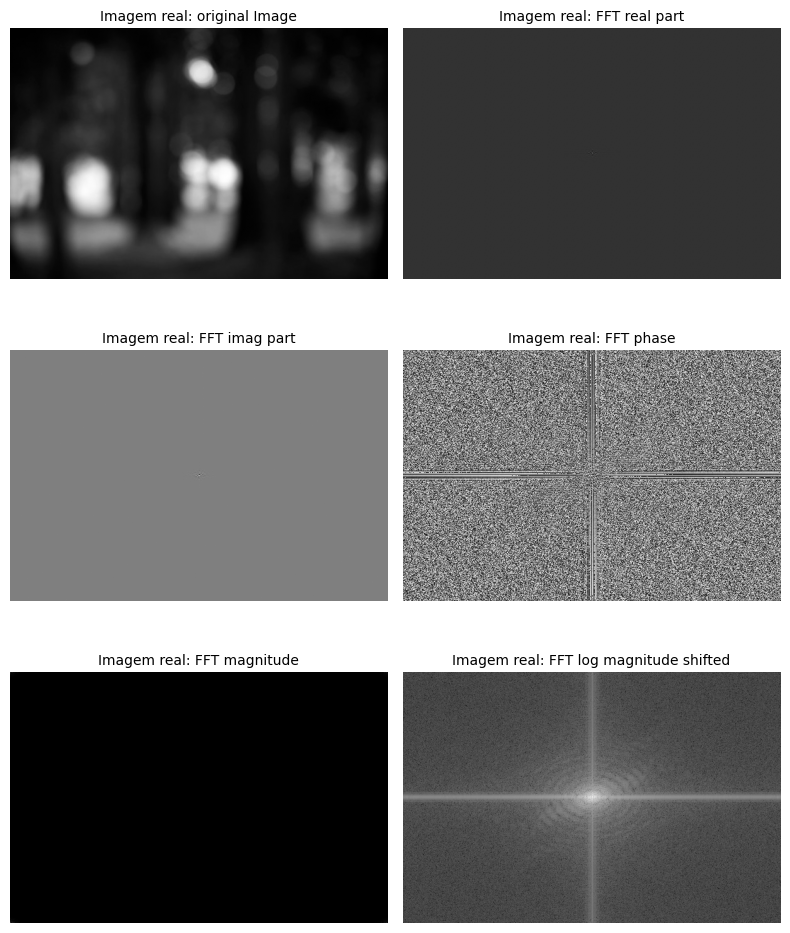

In [13]:
def plotFFT(img, title_prefix=""):
    F = np.fft.fft2(img)
    F_shift = np.fft.fftshift(F)

    real_part = np.real(F_shift)
    imag_part = np.imag(F_shift)
    phase = np.angle(F_shift)
    magnitude = np.abs(F)
    magnitude_shifted = np.abs(F_shift)
    log_magnitude_shifted = np.log(1 + magnitude_shifted)

    fig, axes = plt.subplots(3, 2, figsize=(8, 10))
    axes = axes.ravel()

    images = [
        img,
        real_part,
        imag_part,
        phase,
        magnitude,
        log_magnitude_shifted
    ]

    titles = [
        "original Image",
        "FFT real part",
        "FFT imag part",
        "FFT phase",
        "FFT magnitude",
        "FFT log magnitude shifted"
    ]

    for ax, im, t in zip(axes, images, titles):
        ax.imshow(im, cmap="gray", vmin=np.min(im), vmax=np.max(im))
        ax.set_title(f"{title_prefix}{t}", fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

f = np.zeros((4, 4))
f[1, 1:3] = 255
plotFFT(f, title_prefix="Duotone: ")

from PIL import Image
f_real = Image.open("imgs/img_4.jpg").convert("L")
f_real = np.array(f_real, dtype=float)
plotFFT(f_real, title_prefix="Imagem real: ")

## 2.13 Translação espacial e efeito na FFT

Quando uma imagem é **transladada no espaço**, a **magnitude** da sua Transformada de Fourier **permanece inalterada** — a energia total das frequências não se altera. No entanto, a **fase** sofre uma **variação linear**, refletindo o deslocamento aplicado à imagem.

Se $f(x, y)$ tem transformada $F(u, v)$, então uma translação de $(x_0, y_0)$ resulta em:
$$
f'(x, y) = f(x - x_0,\, y - y_0)
$$
e a correspondente transformada é:
$$
F'(u, v) = F(u, v) \, e^{-j 2 \pi (u x_0 + v y_0)}.
$$

Assim, o deslocamento espacial apenas multiplica o espectro por um fator de **fase complexa** — um termo exponencial cuja inclinação depende da direção e amplitude da translação.

### 2.13.1 Descrição sequencial da operação

1. A imagem original $f(x,y)$ é carregada e processada pela função `plotFFT()`, que mostra as suas componentes espectrais.  

2. A seguir, aplica-se uma **translação horizontal** de uma coluna (`np.roll(f, shift=1, axis=1)`), equivalente a `circshift(f,1,2)` no MATLAB. 

3. Calcula-se novamente a FFT e observam-se as diferenças entre o espectro original e o transladado.  

4. Verifica-se que:
   - a **magnitude** permanece idêntica;
   - a **fase** apresenta uma inclinação linear, refletindo o deslocamento espacial.

### 2.13.2 Interpretação e observações

- A invariância da magnitude confirma que a translação **não altera o conteúdo frequencial** da imagem, apenas a sua posição.  
- A fase, ao variar linearmente, codifica **a localização espacial das estruturas**.  
- Esta propriedade explica por que razão a **fase** contém a maior parte da informação estrutural de uma imagem (como se demonstrará na secção 2.19).

> **Nota prática**  
> – Experimente deslocar a imagem em várias direções (`axis=0` ou `axis=1`) e observar o padrão da fase.  
> – Translações maiores produzem gradientes de fase mais inclinados.  
> – A magnitude pode ser usada como referência para verificar que o conteúdo frequencial permanece constante.
Quando **transladamos uma imagem** no espaço, a **magnitude da Transformada de Fourier** mantém-se idêntica — a energia total das frequências não se altera.  
No entanto, a **fase** sofre uma **variação linear**, refletindo o deslocamento aplicado à imagem.

Nesta célula, usamos `np.roll(f, shift=1, axis=1)` para deslocar a imagem uma coluna para a direita.  
A função `plotFFT()` mostra claramente que:
- a **magnitude** continua igual,  
- e a **fase** muda, traduzindo o novo posicionamento espacial.

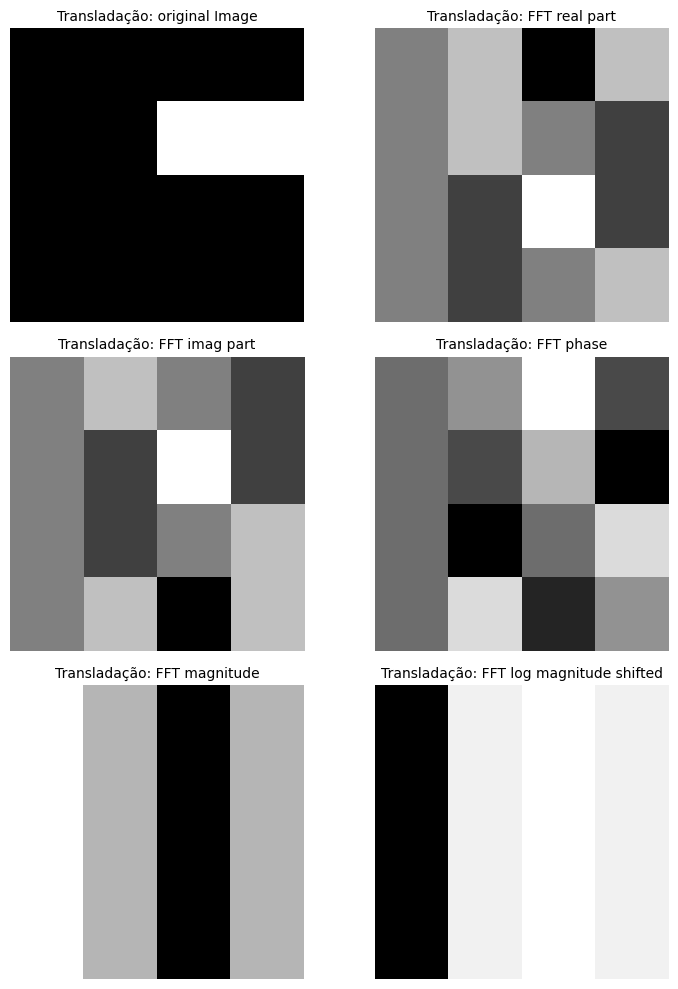

In [14]:
g = np.roll(f, shift=1, axis=1)

plotFFT(g, title_prefix="Transladação: ")

## 2.14 Estrutura de processamento no domínio da frequência

O processamento de imagens no **domínio da frequência** baseia-se na propriedade fundamental da Transformada de Fourier:
$$
\text{convolução no espaço} \;\;\Longleftrightarrow\;\; \text{multiplicação no domínio da frequência}.
$$
Isto significa que operações complexas de filtragem espacial — como suavização, realce ou deteção de arestas — podem ser executadas de forma equivalente e mais eficiente no domínio espectral.

Formalmente, para uma imagem $f(x,y)$ e um filtro $h(x,y)$:
$$
g(x,y) = f(x,y) * h(x,y)
\;\;\Longleftrightarrow\;\;
G(u,v) = F(u,v) \, H(u,v),
$$
onde $F(u,v)$ e $H(u,v)$ são as transformadas de Fourier da imagem e do filtro, respetivamente.

A reconstrução é obtida pela transformada inversa:
$$
g(x,y) = \mathcal{F}^{-1}\{\, G(u,v) \,\}.
$$

### 2.14.1 Descrição sequencial da operação

1. **Transformação para o domínio da frequência:**  
   Aplica-se `np.fft.fft2()` à imagem $f(x,y)$, obtendo-se $F(u,v)$ — uma matriz complexa com informação de magnitude e fase.

2. **Separação das componentes:**  
   Calculam-se a **magnitude** $|F(u,v)|$ e a **fase** $\phi(u,v) = \arg(F(u,v))$:
   $$
   F(u,v) = |F(u,v)| \, e^{j \phi(u,v)}.
   $$

3. **Processamento espectral:**  
   Modificam-se opcionalmente as componentes:
   - Atenuar ou reforçar certas frequências na magnitude;  
   - Alterar a fase para deslocar ou inverter padrões espaciais.  
   Nesta célula, não é feita nenhuma alteração — trata-se apenas de ilustrar o fluxo completo.

4. **Recombinação das componentes:**  
   Reconstrói-se o espectro processado:
   $$
   F'(u,v) = |F'(u,v)| \, e^{j \phi'(u,v)}.
   $$

5. **Transformada inversa:**  
   Obtém-se a imagem processada aplicando `np.fft.ifft2(F')`, recuperando $g(x,y)$ no domínio espacial.

6. **Avaliação de fidelidade:**  
   Calcula-se a diferença absoluta entre a imagem original e a reconstruída:
   $$
   \Delta(x,y) = |\, f(x,y) - g(x,y) \,|.
   $$
   Uma diferença praticamente nula confirma que o processo é reversível e numericamente estável.

### 2.14.2 Interpretação e observações

- O domínio da frequência permite **operar seletivamente** sobre componentes espaciais, sem necessidade de convoluções diretas.  
- Modificações na **magnitude** afetam o contraste e as texturas; alterações na **fase** afetam a forma e a posição das estruturas.  
- A precisão da reconstrução depende apenas de erros numéricos de ponto flutuante — inevitáveis mas insignificantes.

> **Nota prática**  
> – Substitua o bloco “processamento espectral” por manipulações concretas: amplificação de baixas frequências (suavização) ou reforço de altas (nitidez).  
> – Visualize a diferença entre imagem original e reconstruída para confirmar a correção do pipeline FFT–IFFT.  
> – Recorde que modificações na magnitude correspondem a filtros passa-baixo ou passa-alto, enquanto alterações na fase afetam a geometria da imagem.  
> – Este fluxo é a base para todos os filtros no domínio da frequência apresentados nas secções seguintes.


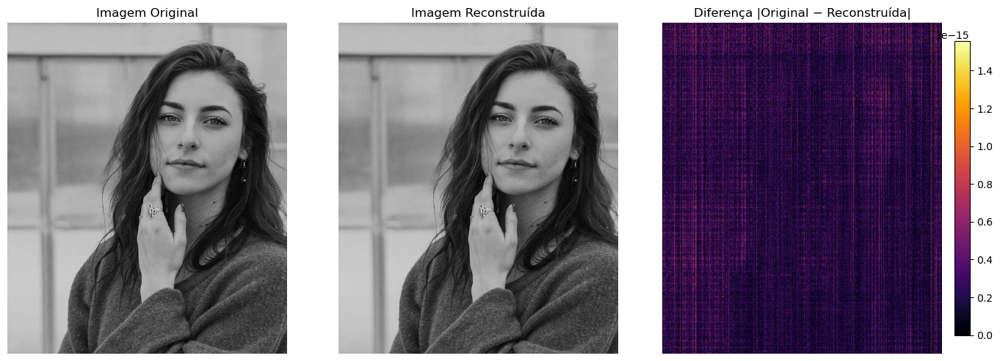

In [15]:
img = Image.open("imgs/human.jpg").convert("L")
img = np.array(img, dtype=float) / 255.0  # normalizar para 0–1

F = np.fft.fft2(img)

mag = np.abs(F)
phi = np.angle(F)

# --- lugar para processamento no domínio da frequência ---
# Exemplo neutro (nenhuma alteração)
mag = mag          # substitui por uma operação interessante
phi = phi          # substitui por uma operação interessante
# -----------------------------------------------------------

F2 = mag * np.exp(1j * phi)

img_proc = np.real(np.fft.ifft2(F2))
img_proc = np.clip(img_proc, 0, 1)

diff = np.abs(img - img_proc)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(img_proc, cmap="gray")
axes[1].set_title("Imagem Reconstruída")
axes[1].axis("off")

im = axes[2].imshow(diff, cmap="inferno")
axes[2].set_title("Diferença |Original − Reconstruída|")
axes[2].axis("off")

fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
plt.tight_layout()
plt.show()

## 2.15 Filtro passa-baixo ideal no domínio da frequência

A convolução no domínio espacial é equivalente a uma multiplicação no domínio da frequência:
$$
g(x,y) = f(x,y) * h(x,y)
\;\;\Longleftrightarrow\;\;
G(u,v) = F(u,v)\,H(u,v),
$$
onde $H(u,v)$ representa a resposta em frequência do filtro.

Aproveitando esta propriedade, é possível aplicar **filtros ideais** diretamente sobre o espectro da imagem.  
Um **filtro passa-baixo ideal** preserva apenas as **frequências baixas** — responsáveis pelas variações suaves de intensidade — e elimina as **altas frequências**, associadas a ruído e detalhes finos.

Formalmente, o filtro é definido como:
$$
H(u,v) =
\begin{cases}
1, & \sqrt{(u-u_0)^2 + (v-v_0)^2} \le D_0, \\
0, & \text{caso contrário,}
\end{cases}
$$
onde $(u_0,v_0)$ é o centro do espectro e $D_0$ o **raio de corte** em frequência.

### 2.15.1 Descrição sequencial da operação

1. **Transformação espectral:**  
   Calcula-se a transformada de Fourier 2D da imagem $f(x,y)$:
   $$
   F(u,v) = \mathcal{F}\{f(x,y)\}.
   $$

2. **Criação do filtro ideal:**  
   Constrói-se uma **máscara binária** $H(u,v)$ centrada no espectro, com valor 1 dentro de um retângulo (ou círculo) de corte $D_0$ e 0 fora dele.  
   A máscara é deslocada com `fftshift()` para alinhar o centro com as frequências baixas.

3. **Filtragem no domínio da frequência:**  
   Multiplica-se diretamente o espectro da imagem pelo filtro:
   $$
   G(u,v) = F(u,v) \, H(u,v).
   $$

4. **Transformada inversa:**  
   Obtém-se a imagem suavizada aplicando:
   $$
   g(x,y) = \mathcal{F}^{-1}\{G(u,v)\}.
   $$

5. **Visualização:**  
   A imagem resultante mostra um **desfoque global e uniforme**, consequência da eliminação das componentes de alta frequência.

### 2.15.2 Interpretação e observações

- O filtro passa-baixo ideal atua como uma **janela retangular** no domínio da frequência (chamamos-lhe em alguns contextos um filtro *brickwall* porque funciona teoricamente como uma parede). O corte abrupto cria uma convolução com uma função $\mathrm{sinc}$ no espaço, o que provoca **oscilações** (rippling) junto a arestas e contornos.  
- Este fenómeno ilustra o **princípio de incerteza**: um limite nítido em frequência implica uma resposta espacial extensa e oscilante.  
- A versão **passa-alto** ideal é simplesmente o complemento do filtro:
  $$
  H_{\text{HP}}(u,v) = 1 - H_{\text{LP}}(u,v).
  $$

> **Nota prática**  
> – Experimente variar o tamanho da janela de corte (`lp_size`) para observar o equilíbrio entre suavização e artefactos de ondulação.  
> – Verifique o efeito de `fftshift()` removendo-o temporariamente: o centro do espectro desloca-se para o canto superior esquerdo.  
> – Teste o filtro complementar $1 - H(u,v)$ para obter um passa-alto ideal que realça arestas e texturas.  
> – A próxima secção (2.16) explora precisamente o efeito de ondulação causado por este corte abrupto.


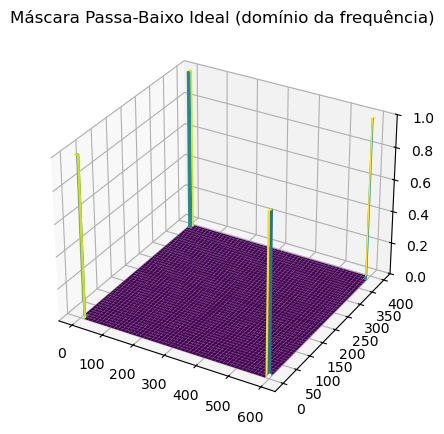

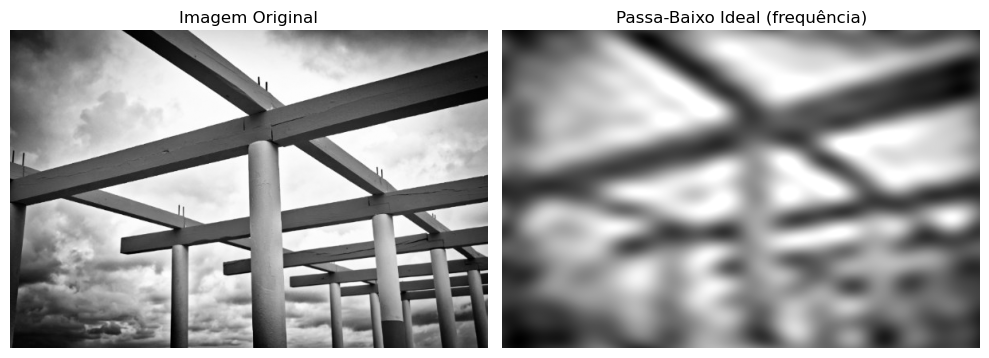

In [16]:
im = Image.open("imgs/img_5.jpg").convert("L")
im = np.array(im, dtype=float)

M, N = im.shape
rM, rN = M // 2, N // 2

im_spec = np.fft.fft2(im)

lp_size = (10, 10)
ideal_LP = np.zeros_like(im)
ideal_LP[rM - lp_size[0]:rM + lp_size[0],
         rN - lp_size[1]:rN + lp_size[1]] = 1

ideal_LP = np.fft.fftshift(ideal_LP)

ideal_HP = 1 - ideal_LP

fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(N), np.arange(M))
ax.plot_surface(X, Y, ideal_LP, cmap="viridis")
ax.set_title("Máscara Passa-Baixo Ideal (domínio da frequência)")
ax.set_zlim(0, 1)
plt.show()

G = ideal_LP * im_spec

g = np.real(np.fft.ifft2(G))
g = np.clip(g, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(im, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(g, cmap="gray")
axes[1].set_title("Passa-Baixo Ideal (frequência)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

## 2.16 Efeito de ondulação ("Rippling effect")

O **filtro passa-baixo ideal**, ao eliminar bruscamente todas as frequências acima de um certo limite, introduz artefactos visuais conhecidos como **“rippling”** ou **efeito de ondulação**. Estas oscilações aparecem junto a arestas e transições abruptas na imagem filtrada.

A origem do fenómeno é matemática: um corte abrupto no domínio da frequência corresponde, no domínio espacial, a uma **convolução com uma função sinc**, de extensão infinita e oscilante.

### 2.16.1 Formulação matemática

Para uma filtragem ideal com raio de corte $D_0$, temos:
$$
H(u,v) =
\begin{cases}
1, & \sqrt{(u-u_0)^2 + (v-v_0)^2} \le D_0, \\
0, & \text{caso contrário.}
\end{cases}
$$

A transformada inversa de $H(u,v)$ no domínio espacial é:
$$
h(x,y) = \mathcal{F}^{-1}\{H(u,v)\} = \mathrm{sinc}(x) \, \mathrm{sinc}(y),
$$
ou, em forma bidimensional:
$$
h(x,y) = \frac{\sin(\pi x)}{\pi x} \cdot \frac{\sin(\pi y)}{\pi y}.
$$

Esta resposta impulsional infinita é responsável pelas **oscilações visuais** observadas após a filtragem:
as zonas de transição entre regiões de contraste forte exibem faixas claras e escuras alternadas.

### 2.16.2 Descrição sequencial da operação

1. **Calcula-se a FFT** da imagem $f(x,y)$, obtendo-se o seu espectro $F(u,v)$.  

2. **Constrói-se uma máscara passa-baixo ideal** de dimensões reduzidas (por exemplo $3\times3$).  

3. **Multiplica-se o espectro** da imagem pela máscara:  
   $$
   G(u,v) = F(u,v)\,H(u,v).
   $$
   
4. **Aplica-se a transformada inversa** $\mathcal{F}^{-1}\{G(u,v)\}$, obtendo-se a imagem filtrada $g(x,y)$.  

5. **Visualizam-se as ondulações** nas regiões de contorno — resultado direto da resposta sinc.

### 2.16.3 Interpretação e observações

- Quanto **menor o filtro** (isto é, quanto mais estreito o corte em frequência), **mais intensa** é a ondulação. Isto ocorre porque a função sinc resultante se estende mais e oscila mais rapidamente.  
- O número de franjas observadas na imagem é aproximadamente proporcional à largura da janela de corte.  
- Este fenómeno ilustra a **dualidade entre domínios espacial e frequencial**: uma operação abrupta em frequência corresponde a uma resposta suave e extensa no espaço, e vice-versa.

> **Nota prática**  
> – Experimente alterar o tamanho do filtro de $(3,3)$ para $(10,10)$ e observe a redução progressiva do rippling.  
> – Verifique como as oscilações se manifestam sobretudo nas transições de alto contraste.  
> – Substitua o filtro ideal por um **Gaussiano** (ver secção 2.18) e compare a suavidade da resposta espacial obtida.  
> – Este exemplo demonstra a importância de preferir **filtros com transições suaves** no domínio da frequência.


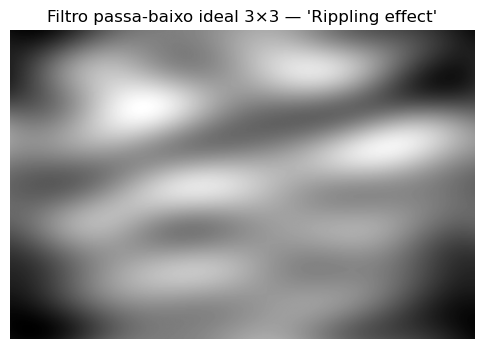

In [17]:
im = Image.open("imgs/img_5.jpg").convert("L")
im = np.array(im, dtype=float)

im_spec = np.fft.fft2(im)

M, N = im.shape
rM, rN = M // 2, N // 2

lp_size = (3, 3)
ideal_LP = np.zeros_like(im)
ideal_LP[rM - lp_size[0]:rM + lp_size[0],
         rN - lp_size[1]:rN + lp_size[1]] = 1
ideal_LP = np.fft.fftshift(ideal_LP)

G = ideal_LP * im_spec

g = np.real(np.fft.ifft2(G))
g = np.clip(g, 0, 255).astype(np.uint8)

plt.figure(figsize=(6, 5))
plt.imshow(g, cmap="gray")
plt.title("Filtro passa-baixo ideal 3×3 — 'Rippling effect'")
plt.axis("off")
plt.show()

## 2.17 Efeito do tamanho do filtro e versão passa-alto correspondente

A modificação do **tamanho do filtro passa-baixo ideal** altera diretamente a largura de banda do espectro preservado. Filtros pequenos produzem cortes mais agressivos nas altas frequências, ao passo que filtros grandes mantêm mais informação, mas reduzem a nitidez global.

Matematicamente, para o filtro ideal definido por:
$$
H_{\text{LP}}(u,v) =
\begin{cases}
1, & \sqrt{(u-u_0)^2 + (v-v_0)^2} \le D_0, \\
0, & \text{caso contrário,}
\end{cases}
$$
aumentar $D_0$ alarga a região de passagem e suaviza o efeito de ondulação (“rippling”), mas a imagem filtrada torna-se progressivamente mais desfocada.

O filtro **passa-alto correspondente** é obtido por complemento lógico:
$$
H_{\text{HP}}(u,v) = 1 - H_{\text{LP}}(u,v),
$$
preservando apenas as **altas frequências**, isto é, as variações rápidas e os contornos da imagem.

### 2.17.1 Descrição sequencial da operação

1. **Cálculo da FFT:**  
   A transformada de Fourier da imagem é obtida com `np.fft.fft2()`, fornecendo $F(u,v)$.

2. **Criação dos filtros:**  
   Constrói-se uma máscara passa-baixo ideal $H_{\text{LP}}$ com raio de corte elevado (ex.: `lp_size = (60, 60)`), e o seu complemento $H_{\text{HP}} = 1 - H_{\text{LP}}$.

3. **Filtragem no domínio da frequência:**  
   - **Passa-baixo:**  
     $$
     G_{\text{LP}}(u,v) = F(u,v) \, H_{\text{LP}}(u,v)
     $$
   - **Passa-alto:**  
     $$
     G_{\text{HP}}(u,v) = F(u,v) \, H_{\text{HP}}(u,v)
     $$

4. **Transformada inversa:**  
   As imagens filtradas são obtidas por:
   $$
   g_{\text{LP}}(x,y) = \mathcal{F}^{-1}\{G_{\text{LP}}(u,v)\}, \qquad
   g_{\text{HP}}(x,y) = \mathcal{F}^{-1}\{G_{\text{HP}}(u,v)\}.
   $$

5. **Comparação visual:**  
   A imagem passa-baixo apresenta um desfoque global;  
   a imagem passa-alto realça arestas e detalhes finos, mas perde gradientes suaves.

### 2.17.2 Interpretação e observações

- **Efeito do tamanho do filtro:**  
  - Filtros pequenos → corte abrupto e ondulação intensa (“rippling”).  
  - Filtros grandes → resposta mais estável, porém com maior suavização.
- **Dualidade entre passa-baixo e passa-alto:**  
  Ambos formam um par complementar:
  $$
  H_{\text{LP}}(u,v) + H_{\text{HP}}(u,v) = 1.
  $$
  Assim, a soma das duas imagens filtradas aproxima-se da imagem original.
- **Relação com o realce:**  
  O passa-alto ideal atua como um **realce de contornos**. Quando combinado com a imagem original, obtém-se um resultado semelhante ao *Unsharp Mask* (ver secção 2.11).

> **Nota prática**  
> – Experimente variar o tamanho da janela (`lp_size`) entre (10, 10) e (80, 80) para observar a transição gradual entre nitidez e suavização.  
> – Compare a imagem passa-alto com o resultado do *Unsharp Mask* para perceber a semelhança entre os métodos.  
> – Verifique numericamente que $g_{\text{LP}} + g_{\text{HP}} \approx f$, confirmando a complementaridade dos filtros.  
> – Lembre-se de que, embora o filtro ideal seja didático, versões suaves (como o Gaussiano) produzem resultados visualmente mais naturais — ver secção 2.18.


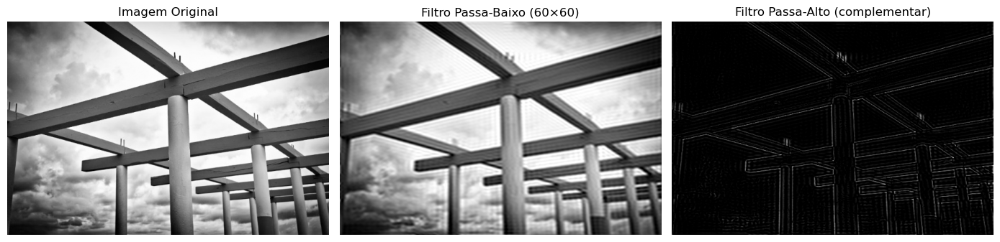

In [18]:
im = Image.open("imgs/img_5.jpg").convert("L")
im = np.array(im, dtype=float)

im_spec = np.fft.fft2(im)

M, N = im.shape
rM, rN = M // 2, N // 2

lp_size = (60, 60)
ideal_LP = np.zeros_like(im)
ideal_LP[rM - lp_size[0]:rM + lp_size[0],
         rN - lp_size[1]:rN + lp_size[1]] = 1
ideal_LP = np.fft.fftshift(ideal_LP)

ideal_HP = 1 - ideal_LP

# --- Passa-baixo ---
G_lp = ideal_LP * im_spec
g_lp = np.real(np.fft.ifft2(G_lp))
g_lp = np.clip(g_lp, 0, 255).astype(np.uint8)

# --- Passa-alto ---
G_hp = ideal_HP * im_spec
g_hp = np.real(np.fft.ifft2(G_hp))
g_hp = np.clip(g_hp, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(im, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(g_lp, cmap="gray")
axes[1].set_title("Filtro Passa-Baixo (60×60)")
axes[1].axis("off")

axes[2].imshow(g_hp, cmap="gray")
axes[2].set_title("Filtro Passa-Alto (complementar)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 2.18 Filtro Gaussiano no domínio da frequência

Os **filtros ideais** apresentam um corte abrupto em frequência e produzem o chamado *rippling effect*. Para evitar essas ondulações, recorre-se a filtros com transição **suave** entre a banda de passagem e a de rejeição — sendo o **filtro Gaussiano** o exemplo mais importante.

A função Gaussiana é contínua e infinitamente diferenciável, garantindo uma transição gradual no domínio da frequência e uma resposta suave no espaço.

### 2.18.1 Formulação matemática

A função Gaussiana bidimensional no domínio da frequência é dada por:
$$
H(u,v) = e^{-\frac{(u^2 + v^2)}{2\sigma^2}},
$$
onde $\sigma$ controla a largura da banda de passagem — quanto maior o valor de $\sigma$, mais frequências são preservadas.

No domínio espacial, o filtro equivalente é também Gaussiano:
$$
h(x,y) = \frac{1}{2\pi\sigma^2}\, e^{-\frac{(x^2 + y^2)}{2\sigma^2}}.
$$

### 2.18.2 Descrição sequencial da operação

1. **Geração da imagem sintética:**  
   Cria-se uma imagem com zonas de intensidade constante e contrastes bem definidos, para evidenciar os efeitos da filtragem.

2. **Criação do filtro Gaussiano 2D:**  
   Constrói-se um núcleo $h(x,y)$ de dimensão $256\times256$ e desvio padrão $\sigma=10$:
   - Calcula-se primeiro a versão unidimensional;
   - Obtém-se o filtro bidimensional por produto externo (`np.outer`).

3. **Transformação espectral:**  
   Aplica-se a transformada de Fourier à imagem e ao filtro, obtendo $F(u,v)$ e $H(u,v)$.

4. **Filtragem no domínio da frequência:**  
   Multiplica-se diretamente os dois espectros:
   $$
   G(u,v) = F(u,v)\,H(u,v),
   $$
   e obtém-se a imagem suavizada pela transformada inversa:
   $$
   g(x,y) = \mathcal{F}^{-1}\{G(u,v)\}.
   $$

5. **Comparação com filtragem espacial:**  
   Aplica-se também a convolução direta `convolve(f, h)` para comprovar que, com zero-padding adequado, a filtragem espacial e a filtragem espectral produzem resultados equivalentes.

### 2.18.3 Interpretação e observações

- O filtro Gaussiano apresenta **transição suave** entre as frequências mantidas e eliminadas, o que elimina as oscilações (rippling) observadas no filtro ideal.
- A resposta espacial é também **Gaussiana** — concentrada, suave e sem artefactos. O gradiente contínuo no domínio da frequência traduz-se num desfoque uniforme e natural.
- O parâmetro $\sigma$ determina o grau de suavização: valores baixos produzem leve suavização; valores altos removem detalhes finos e texturas.
- A multiplicação espectral e a convolução espacial são equivalentes, desde que o cálculo da FFT use **zero-padding** suficiente — tema da secção seguinte (2.19).

> **Nota prática**  
> – Visualize o espectro logarítmico de $H(u,v)$ em 3D para observar a forma suave e circular do filtro.  
> – Experimente aumentar $\sigma$ para 20 e note o aumento da suavização.  
> – Compare as imagens filtradas nos domínios espacial e espectral — devem coincidir até pequenas diferenças numéricas.  
> – Substitua o filtro Gaussiano por um ideal e comp


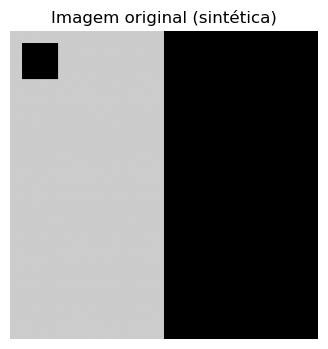

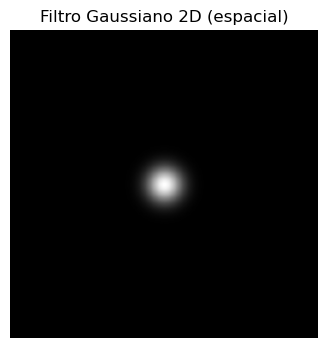

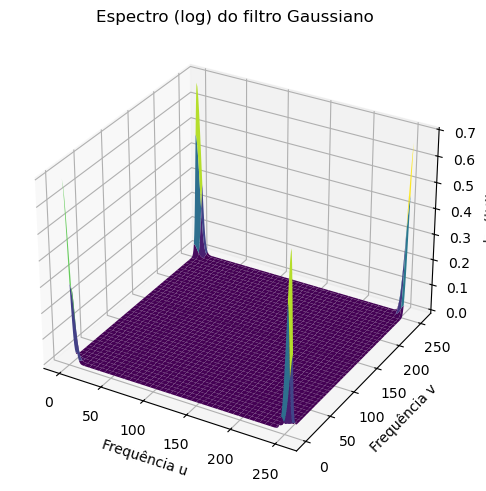

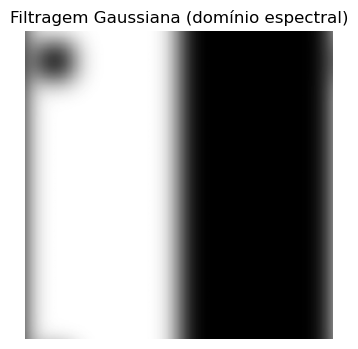

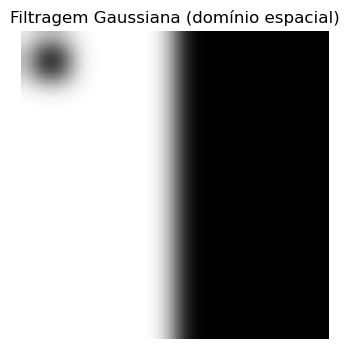

In [19]:
f = np.zeros((256, 256))
f[:, :128] = 0.8
f[10:40, 10:40] = 0.0

plt.figure(figsize=(4, 4))
plt.imshow(f, cmap="gray", vmin=0, vmax=1)
plt.title("Imagem original (sintética)")
plt.axis("off")
plt.show()

x = np.linspace(-128, 127, 256)
sigma = 10
gauss_1d = np.exp(-0.5 * (x / sigma) ** 2)
gauss_1d /= gauss_1d.sum()
h = np.outer(gauss_1d, gauss_1d)

plt.figure(figsize=(4, 4))
plt.imshow(h, cmap="gray")
plt.title("Filtro Gaussiano 2D (espacial)")
plt.axis("off")
plt.show()

F = np.fft.fft2(f)
Fpadded = np.fft.fft2(f, s=(f.shape[0] * 2 - 1, f.shape[1] * 2 - 1))
H = np.abs(np.fft.fft2(h))
Hpadded = np.abs(np.fft.fft2(h, s=(f.shape[0] * 2 - 1, f.shape[1] * 2 - 1)))

# Visualizar espectro logarítmico do filtro
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.arange(H.shape[1]), np.arange(H.shape[0]))
ax.plot_surface(X, Y, np.log(1 + H), cmap="viridis")
ax.set_title("Espectro (log) do filtro Gaussiano")
ax.set_xlabel("Frequência u")
ax.set_ylabel("Frequência v")
ax.set_zlabel("log(|H|)")
plt.tight_layout()
plt.show()

G = H * F
g = np.real(np.fft.ifft2(G))

f_uint8 = np.clip(f * 255, 0, 255).astype(np.uint8)
g_uint8 = np.clip(g * 255, 0, 255).astype(np.uint8)

plt.figure(figsize=(4, 4))
plt.imshow(g_uint8, cmap="gray")
plt.title("Filtragem Gaussiana (domínio espectral)")
plt.axis("off")
plt.show()

g_spatial = convolve(f, h, mode="reflect")
plt.figure(figsize=(4, 4))
plt.imshow(g_spatial, cmap="gray")
plt.title("Filtragem Gaussiana (domínio espacial)")
plt.axis("off")
plt.show()

## 2.19 Zero-padding para filtragem correta no domínio da frequência

A **multiplicação espectral** e a **convolução espacial** são teoricamente equivalentes, mas na prática produzem resultados ligeiramente diferentes devido à **circularidade implícita da Transformada de Fourier**.

Quando a FFT é aplicada sem **zero-padding**, a imagem é tratada como se fosse **periódica**: as arestas “enrolam-se” sobre si próprias, provocando **artefactos nas extremidades** da imagem filtrada.

O *zero-padding* elimina esse problema ao expandir a imagem e o filtro com zeros antes da transformação, garantindo que a convolução se comporte como uma **convolução linear verdadeira**.

### 2.19.1 Formulação matemática

Para uma imagem $f(x, y)$ de dimensão $M \times N$ e um filtro $h(x, y)$ de dimensão $A \times B$,  
as dimensões mínimas para uma convolução linear sem sobreposição circular são:
$$
P \ge M + A - 1, \qquad Q \ge N + B - 1.
$$

Na prática, utiliza-se frequentemente o tamanho:
$$
P = 2M - 1, \qquad Q = 2N - 1,
$$
que simplifica a implementação e garante espaço suficiente para o suporte do filtro.

Assim, temos:
$$
\begin{aligned}
F_P(u,v) &= \mathcal{F}\{ f(x,y) \}_{P \times Q}, \\
H_P(u,v) &= \mathcal{F}\{ h(x,y) \}_{P \times Q}, \\
G_P(u,v) &= F_P(u,v) \cdot H_P(u,v), \\
g(x,y) &= \Re\left[\mathcal{F}^{-1}\{ G_P(u,v) \}\right]_{M \times N}.
\end{aligned}
$$

### 2.19.2 Descrição sequencial da operação

1. **Definição das dimensões expandidas:**  
   Calculam-se $P = 2M - 1$ e $Q = 2N - 1$ com base nas dimensões da imagem e do filtro.

2. **Transformadas com padding:**  
   - Aplica-se a FFT à imagem e ao filtro com dimensões $(P, Q)$:  
     `Fpadded = np.fft.fft2(f, s=(P, Q))`,  
     `Hpadded = np.fft.fft2(h, s=(P, Q))`.

3. **Multiplicação espectral:**  
   Calcula-se o produto ponto-a-ponto:  
   $$
   G_P(u,v) = F_P(u,v)\,H_P(u,v).
   $$

4. **Transformada inversa e recorte:**  
   Aplica-se `ifft2()` e recorta-se o resultado às dimensões originais $(M, N)$:  
   $$
   g(x,y) = \Re\left[\mathcal{F}^{-1}\{G_P(u,v)\}\right]_{0:M,\,0:N}.
   $$

5. **Comparação:**  
   - A imagem obtida com padding coincide com a convolução espacial `convolve(f, h)`.  
   - Sem padding, surgem artefactos nas arestas devido à sobreposição circular.

### 2.19.3 Interpretação e observações

- O *zero-padding* garante que o suporte da convolução cabe integralmente na matriz FFT, evitando a “circularidade” e reproduzindo a convolução linear exata.
- Com padding insuficiente, as arestas da imagem interferem entre si, gerando padrões incorretos e contaminação espectral.
- Em implementações práticas (OpenCV, SciPy, TensorFlow), esta técnica é usada automaticamente para filtros grandes ou convoluções FFT-otimizadas.

> **Nota prática**  
> – Compare as três imagens: espacial, espectral sem padding e espectral com padding.  
> – Observe que apenas a última coincide com a referência espacial.  
> – Verifique que os artefactos sem padding aparecem sobretudo nas arestas.  
> – Para filtros pequenos, a diferença é mínima, mas para filtros grandes o *zero-padding* é indispensável.


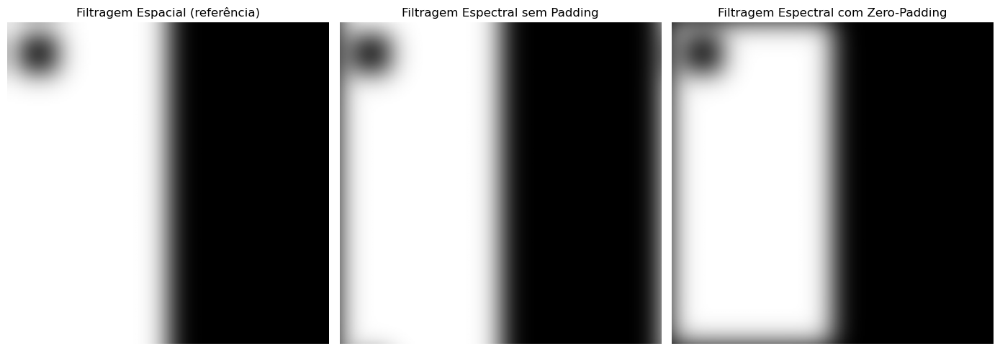

In [20]:
M, N = f.shape
A, B = h.shape

P = 2 * M - 1
Q = 2 * N - 1

Fpadded = np.fft.fft2(f, s=(P, Q))
Hpadded = np.abs(np.fft.fft2(h, s=(P, Q)))

Gpadded = Hpadded * Fpadded

gpadded = np.real(np.fft.ifft2(Gpadded))
gpadded = gpadded[:M, :N]
gpadded = np.clip(gpadded, 0, 1)

g_spatial = convolve(f, h, mode="reflect")
G = np.abs(np.fft.fft2(h))
Gsimple = G * np.fft.fft2(f)
g_simple = np.real(np.fft.ifft2(Gsimple))
g_simple = np.clip(g_simple, 0, 1)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(g_spatial, cmap="gray")
axes[0].set_title("Filtragem Espacial (referência)")
axes[0].axis("off")

axes[1].imshow(g_simple, cmap="gray")
axes[1].set_title("Filtragem Espectral sem Padding")
axes[1].axis("off")

axes[2].imshow(gpadded, cmap="gray")
axes[2].set_title("Filtragem Espectral com Zero-Padding")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 2.20 Reconstrução a partir de magnitude e fase

A Transformada de Fourier permite decompor uma imagem em duas componentes fundamentais:

- **Magnitude** – representa a energia de cada frequência presente;  
- **Fase** – codifica a posição e a estrutura espacial das formas.

Apesar de ambas serem necessárias para uma reconstrução exata, é a **fase** que contém a maior parte da informação estrutural da imagem. Sem ela, a imagem torna-se irreconhecível, mesmo que a magnitude esteja correta.

### 2.20.1 Formulação matemática

Para uma imagem $f(x,y)$ com transformada de Fourier $F(u,v)$, temos:
$$
F(u,v) = |F(u,v)| \, e^{j \phi(u,v)},
$$
onde $|F(u,v)|$ é a **magnitude** e $\phi(u,v)$ é a **fase**.

A reconstrução é obtida por:
$$
f(x,y) = \Re \left\{ \mathcal{F}^{-1}\left( |F(u,v)| \, e^{j \phi(u,v)} \right) \right\}.
$$

Se apenas uma das componentes for mantida:
- **Com fase nula** ($\phi=0$): a imagem reconstruída apresenta brilho geral, mas perde forma e detalhe.
- **Com magnitude unificada** ($|F|=1$): a imagem recupera contornos e formas reconhecíveis, demonstrando a importância da fase.

### 2.20.2 Descrição sequencial da operação

1. **Cálculo da FFT:**  
   Obtém-se o espectro da imagem $F(u,v) = \mathcal{F}\{f(x,y)\}$.

2. **Separação das componentes:**  
   - Magnitude: $|F(u,v)| = \sqrt{\Re(F)^2 + \Im(F)^2}$  
   - Fase: $\phi(u,v) = \arctan\left( \frac{\Im(F)}{\Re(F)} \right)$

3. **Reconstruções parciais:**
   - **Apenas magnitude:**  
     $$
     F_{\text{mag}}(u,v) = |F(u,v)|
     $$
     (fase igual a zero)
   - **Apenas fase:**  
     $$
     F_{\text{phase}}(u,v) = e^{j \phi(u,v)}
     $$
     (magnitude unificada)
   - **Completa:**  
     $$
     F_{\text{recon}}(u,v) = |F(u,v)| \, e^{j \phi(u,v)}
     $$

4. **Transformada inversa:**  
   Aplica-se $\mathcal{F}^{-1}$ a cada um dos três espectros, obtendo:
   $$
   f_{\text{mag}}(x,y), \quad f_{\text{phase}}(x,y), \quad f_{\text{recon}}(x,y)
   $$

5. **Normalização e visualização:**  
   - A imagem de fase é normalizada para o intervalo [0, 1] para visualização adequada.  
   - A comparação direta entre as três reconstruções revela o papel dominante da fase.

### 2.20.3 Interpretação e observações

- A **fase** define a estrutura e a posição dos objetos. Mesmo com magnitude uniforme, a imagem reconstruída mantém formas reconhecíveis.
- A **magnitude** define o contraste e a distribuição global de energia. Sem a fase, a imagem torna-se amorfa e sem contornos definidos.
- Esta experiência mostra que a **informação geométrica** da imagem está essencialmente na fase, enquanto a magnitude atua como um envelope energético.
- O espectro de magnitude (em escala logarítmica e com `fftshift`) apresenta energia concentrada no centro — correspondendo às baixas frequências (iluminação e brilho global). Já o mapa de fase (em radianos) apresenta padrões complexos e aparentemente aleatórios.

> **Nota prática**  
> – Observe visualmente as três reconstruções:  
>   • Apenas magnitude → difusa e irreconhecível;  
>   • Apenas fase → reconhecível e estruturada;  
>   • Ambas → idêntica ao original.  
> – Aplique o mesmo teste em imagens de natureza diferente (retratos, texturas, paisagens).  
> – Visualize o mapa de fase com `cmap='twilight'` para destacar a continuidade angular.  
> – Compare os espectros com e sem `fftshift` para compreender a localização das baixas frequências.



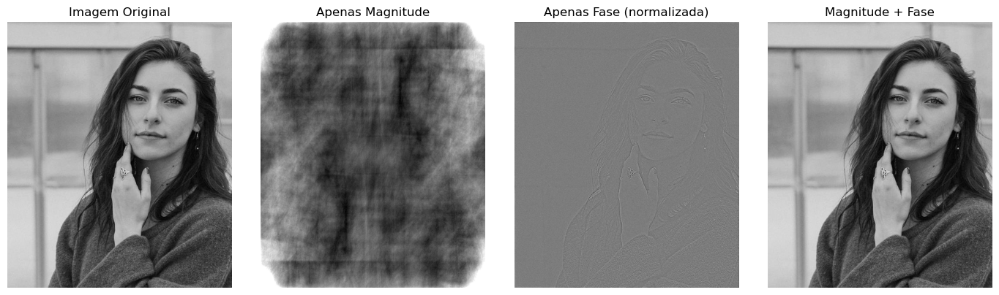

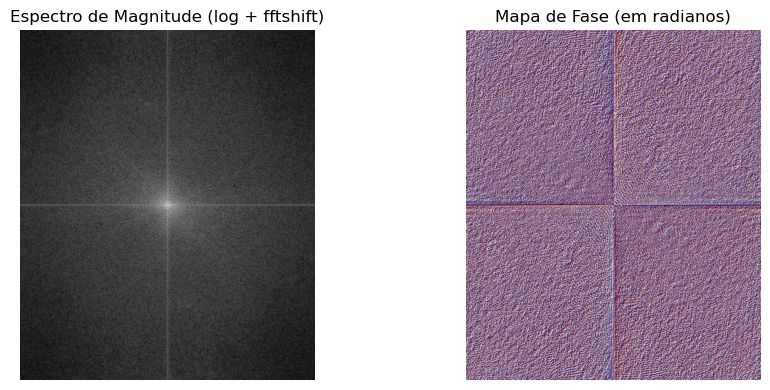

In [21]:
img = Image.open("imgs/humanBW.jpg").convert("L")
img = np.array(img, dtype=float) / 255.0

F = np.fft.fft2(img)
mag = np.abs(F)
phi = np.angle(F)

# --- Reconstruções ---

# Apenas magnitude (fase nula)
F_mag = mag
img_from_mag = np.real(np.fft.ifft2(F_mag))
img_from_mag = np.clip(img_from_mag, 0, 1)

# Apenas fase (magnitude unificada)
F_phase = np.exp(1j * phi)
img_from_phase = np.real(np.fft.ifft2(F_phase))

# Normalizar imagem de fase para [0,1] (para visualização correta)
img_from_phase -= img_from_phase.min()
img_from_phase /= img_from_phase.max()

# Magnitude + fase (reconstrução completa)
F_recon = mag * np.exp(1j * phi)
img_recon = np.real(np.fft.ifft2(F_recon))
img_recon = np.clip(img_recon, 0, 1)

fig,  axes = plt.subplots(1, 4, figsize=(14, 4))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(img_from_mag, cmap="gray")
axes[1].set_title("Apenas Magnitude")
axes[1].axis("off")

axes[2].imshow(img_from_phase, cmap="gray")
axes[2].set_title("Apenas Fase (normalizada)")
axes[2].axis("off")

axes[3].imshow(img_recon, cmap="gray")
axes[3].set_title("Magnitude + Fase")
axes[3].axis("off")

plt.tight_layout()
plt.show()

F_shift = np.fft.fftshift(F)
mag_shift = np.log(1 + np.abs(F_shift))  # escala logarítmica
phi_shift = np.angle(F_shift)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(mag_shift, cmap="gray")
axes[0].set_title("Espectro de Magnitude (log + fftshift)")
axes[0].axis("off")

axes[1].imshow(phi_shift, cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1].set_title("Mapa de Fase (em radianos)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

## 2.21 Transformada de Fourier de janelas (STFT)

A **Transformada de Fourier de janelas** (*Short-Time Fourier Transform*, STFT) é uma extensão da Transformada de Fourier clássica, que permite **analisar variações locais de frequência** em diferentes regiões de uma imagem.

Em vez de aplicar a FFT a toda a imagem (análise global), a STFT aplica-a **a pequenas janelas** (ou blocos) da imagem, proporcionando uma visão **espacialmente localizada** da energia espectral.

Esta técnica é análoga à análise tempo-frequência usada em sinais de áudio — mas aqui a decomposição é feita sobre **blocos bidimensionais**.

### 2.21.1 Formulação matemática

A Transformada de Fourier de janelas é definida como:

$$
F(x_0, y_0, u, v) = 
\iint f(x, y)\, w(x - x_0, y - y_0)\,
e^{-j2\pi(ux + vy)} \, dx\,dy,
$$

onde:
- $f(x, y)$ é a imagem original;  
- $w(x, y)$ é a **janela local** (por exemplo, uma janela quadrada ou Gaussiana);  
- $(x_0, y_0)$ são as coordenadas do centro da janela.

A magnitude de $F(x_0, y_0, u, v)$ indica **quais as frequências presentes** na vizinhança de $(x_0, y_0)$.

### 2.21.2 Descrição sequencial da operação

1. **Divisão da imagem em blocos:**  
   A imagem $f(x, y)$ é subdividida em blocos não sobrepostos (ex.: $32 \times 32$). Cada bloco representa uma pequena região espacial.

2. **Transformada de Fourier local:**  
   Para cada bloco, aplica-se a FFT 2D:  
   $$
   F_{ij}(u,v) = \mathcal{F}\{f_{ij}(x,y)\}
   $$
   obtendo-se o espectro local.

3. **Cálculo da energia local:**  
   A energia espectral é calculada como:
   $$
   E_{ij} = \log\!\big(1 + \sum_{u,v} |F_{ij}(u,v)|^2\big)
   $$
   O logaritmo suaviza a gama dinâmica dos valores.

4. **Construção do mapa de energia:**  
   Os valores $E_{ij}$ são organizados numa grelha, produzindo um **mapa de energia local** — regiões com maior energia correspondem a **texturas** ou **padrões regulares**.

5. **Visualização:**  
   O mapa é representado com uma escala de cores (ex.: *inferno*), revelando as áreas de maior complexidade espectral na imagem.

### 2.21.3 Interpretação e observações

- A STFT permite observar **onde** ocorrem as diferentes frequências na imagem. Zonas lisas apresentam baixa energia concentrada no centro do espectro, enquanto zonas com padrões ou texturas exibem energia dispersa em altas frequências.
- Existe um **compromisso entre resolução espacial e frequência**:  
  - janelas pequenas → boa localização espacial, má resolução espectral;  
  - janelas grandes → melhor resolução em frequência, mas menor detalhe espacial.
- Este equilíbrio é análogo ao **princípio de incerteza de Heisenberg** em sinais 2D: quanto mais localizada é a janela, menos precisa é a estimativa de frequência.
- A STFT é uma base conceitual para transformações mais avançadas, como a **Wavelet Transform**, que usa janelas adaptativas em vez de fixas.

> **Nota prática**  
> – Experimente alterar o tamanho dos blocos (`block = 16`, `32`, `64`) e observe como muda o mapa de energia.  
> – Áreas texturadas (edifícios, relvado, árvores) produzem valores altos.  
> – Zonas planas (céu, paredes lisas) têm energia próxima de zero.  
> – Para análise contínua, substitua o corte em blocos por janelas deslizantes e sobrepostas (STFT com *overlap*).


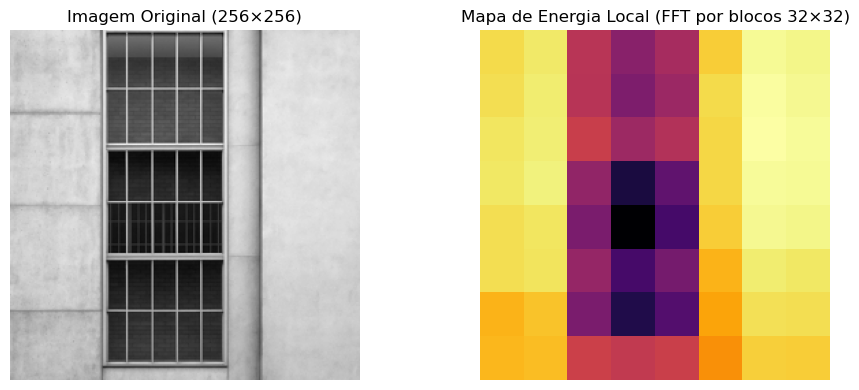

In [22]:
img = Image.open("imgs/urban3.png").convert("L").resize((256, 256))
img = np.array(img, dtype=float) / 255.0

block = 32
rows, cols = img.shape

energy_map = np.zeros((rows // block, cols // block))

for i in range(0, rows, block):
    for j in range(0, cols, block):
        patch = img[i:i+block, j:j+block]
        if patch.shape == (block, block):
            F = np.fft.fft2(patch)
            energy_map[i // block, j // block] = np.log(1 + np.sum(np.abs(F)**2))

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Imagem Original (256×256)")
axes[0].axis("off")

axes[1].imshow(energy_map, cmap="inferno")
axes[1].set_title("Mapa de Energia Local (FFT por blocos 32×32)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

## 2.22 Filtros de Gabor (textura e orientação)

Os **filtros de Gabor** são filtros bidimensionais seletivos em **frequência** e **orientação**, sendo amplamente usados na análise de texturas, deteção de arestas e reconhecimento de padrões.

Cada filtro atua como uma **onda sinusoidal modulada por uma Gaussiana**, resposta que combina **localização espacial** e **seletividade em frequência** — imitando o comportamento de certos neurónios visuais no córtex humano.

### 2.22.1 Formulação matemática

Um filtro de Gabor bidimensional pode ser expresso como:

$$
g(x, y) = \exp\!\left(-\frac{x'^2 + \gamma^2 y'^2}{2\sigma^2}\right)
\cos\!\left(2\pi \frac{x'}{\lambda} + \psi\right),
$$

onde:

- $x' = x\cos\theta + y\sin\theta$  
- $y' = -x\sin\theta + y\cos\theta$  
- $\sigma$ – largura da Gaussiana (controlo da escala);  
- $\lambda$ – comprimento de onda da componente sinusoidal (controlo da frequência);  
- $\gamma$ – razão de aspeto (controlo da elongação);  
- $\psi$ – fase da sinusoidal (controlo da polaridade);  
- $\theta$ – orientação do filtro.

A **Transformada de Fourier** de um filtro de Gabor é também Gaussiana, centrada na frequência $(u_0, v_0)$ correspondente à orientação e frequência da sinusoidal — por isso, é simultaneamente **localizado no espaço e no espectro**.

### 2.22.2 Descrição sequencial da operação

1. **Carregamento da imagem:**  
   Converte-se a imagem para tons de cinzento e normaliza-se para [0, 1].
2. **Definição dos parâmetros do filtro:**  
   Escolhe-se uma frequência $\texttt{frequency = 0.2}$ e quatro orientações:  
   $$
   \theta \in \{0^\circ, 45^\circ, 90^\circ, 135^\circ\}.
   $$
3. **Aplicação dos filtros de Gabor:**  
   Para cada orientação $\theta$, aplica-se:
   $$
   g_\theta(x,y) = \mathcal{G}_\theta \ast f(x,y),
   $$
   onde $\mathcal{G}_\theta$ é o núcleo de Gabor rotacionado. Cada resposta realçada mostra as estruturas **alinhadas** com a direção do filtro.
4. **Normalização das respostas:**  
   As saídas são reescaladas para o intervalo [0, 1] antes da visualização.
5. **Visualização comparativa:**  
   A imagem original é mostrada lado a lado com as respostas das quatro orientações.

### 2.22.3 Interpretação e observações

- Os filtros de Gabor respondem fortemente a **texturas periódicas** e **arestas orientadas**. Cada orientação extrai padrões numa direção específica — horizontal, vertical ou diagonal.
- A combinação de várias escalas e orientações permite construir **descritores de textura** robustos, amplamente usados em reconhecimento de faces e classificação de materiais.
- O parâmetro $\lambda$ define a **frequência central** do filtro:  
  - valores baixos → detetam detalhes finos;  
  - valores altos → detetam padrões largos e suaves.
- O parâmetro $\sigma$ controla a **largura da janela Gaussiana**:  
  - janelas maiores produzem resposta mais global;  
  - janelas pequenas captam detalhes locais.
- O parâmetro $\gamma$ controla a **anisotropia** —  
  $\gamma < 1$ alonga o filtro, tornando-o mais sensível a direções específicas.

> **Nota prática**  
> – Visualize o mapa de resposta de cada orientação e note a seletividade direcional.  
> – Combine as quatro respostas com uma operação de máximo (`np.max(responses, axis=0)`)  
>   para obter um mapa geral de textura.  
> – Experimente variações em `frequency` e `sigma` para observar como o filtro responde  
>   a texturas mais finas ou mais largas.  
> – Os filtros de Gabor formam uma base quase ótima para decomposição espaço-frequencial,  
>   e inspiram as **camadas convolucionais iniciais das CNNs modernas**.



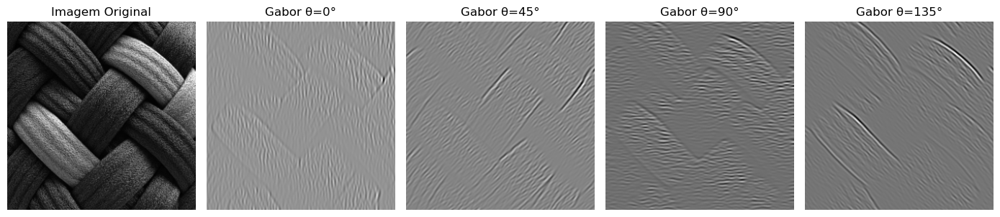

In [23]:
img = Image.open("imgs/oriented2.png").convert("L").resize((256, 256))
img = np.array(img, dtype=float) / 255.0

angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
responses = []

for theta in angles:
    real, _ = gabor(img, frequency=0.2, theta=theta)
    responses.append(real)

fig, axes = plt.subplots(1, 5, figsize=(14, 4))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Imagem Original")
axes[0].axis("off")

for i, (theta, resp) in enumerate(zip(angles, responses)):
    axes[i+1].imshow(resp, cmap="gray")
    axes[i+1].set_title(f"Gabor θ={int(np.degrees(theta))}°")
    axes[i+1].axis("off")

plt.tight_layout()
plt.show()

## 2.23 Compressão e reconstrução com DCT

A **Transformada Discreta do Cosseno** (*Discrete Cosine Transform*, DCT) é uma ferramenta fundamental na **compressão de imagens**. Tal como a Transformada de Fourier, ela decompõe a imagem em funções harmónicas, mas utiliza apenas **cossenos reais**, o que evita redundâncias e facilita a compactação.

A DCT é particularmente eficiente porque **a energia da imagem tende a concentrar-se** nos coeficientes de **baixa frequência**, correspondentes a variações lentas de intensidade — enquanto os coeficientes de alta frequência (detalhes finos e ruído) contêm pouca energia e podem ser descartados.


### 2.23.1 Formulação matemática

Para uma imagem $f(x,y)$ de dimensão $M \times N$, a DCT bidimensional é definida como:

$$
F(u,v) = \frac{2}{\sqrt{MN}} \, \alpha(u)\,\alpha(v)
\sum_{x=0}^{M-1} \sum_{y=0}^{N-1}
f(x,y) \,
\cos\!\left[\frac{\pi (2x+1)u}{2M}\right]
\cos\!\left[\frac{\pi (2y+1)v}{2N}\right],
$$

onde
$$
\alpha(k) =
\begin{cases}
\frac{1}{\sqrt{2}}, & k=0,\\
1, & k>0.
\end{cases}
$$

A transformada inversa é dada por:

$$
f(x,y) = \frac{2}{\sqrt{MN}}
\sum_{u=0}^{M-1} \sum_{v=0}^{N-1}
\alpha(u)\,\alpha(v)\,
F(u,v)\,
\cos\!\left[\frac{\pi (2x+1)u}{2M}\right]
\cos\!\left[\frac{\pi (2y+1)v}{2N}\right].
$$

### 2.23.2 Descrição sequencial da operação

1. **Transformação DCT:**  
   Aplica-se a DCT 2D à imagem normalizada $f(x,y)$, obtendo o conjunto de coeficientes $F(u,v)$. Os valores próximos de $(0,0)$ correspondem às frequências baixas (estrutura global), enquanto os coeficientes distantes codificam detalhes finos e ruído.

2. **Ordenação e truncagem:**  
   Calcula-se o valor absoluto de todos os coeficientes e ordena-se por magnitude. Mantém-se apenas uma fração $r$ dos coeficientes de maior valor — por exemplo, $r \in \{0.05, 0.10, 0.25\}$ — definindo um **nível de compressão**.

3. **Filtragem em frequência:**  
   Constrói-se uma máscara binária $M(u,v)$ tal que:
   $$
   M(u,v) =
   \begin{cases}
   1, & |F(u,v)| \ge \tau, \\
   0, & \text{caso contrário,}
   \end{cases}
   $$
   onde $\tau$ é o limiar correspondente ao valor do coeficiente que delimita os $r\%$ mais energéticos.

4. **Reconstrução inversa (IDCT):**  
   Calcula-se a IDCT sobre os coeficientes preservados:
   $$
   g(x,y) = \mathcal{C}^{-1}\{F(u,v) \cdot M(u,v)\}.
   $$
   A imagem resultante apresenta a mesma estrutura geral, mas com perda gradual de detalhe à medida que $r$ diminui.

5. **Visualização e comparação:**  
   Representam-se a imagem original e as versões reconstruídas para diferentes percentagens de coeficientes. Observa-se que **mesmo com apenas 10–25% dos coeficientes**, a forma global é preservada.

### 2.23.3 Interpretação e observações

- A DCT concentra a **energia da imagem nas frequências baixas**, o que torna possível uma **compressão com perdas controladas** e **alta eficiência visual**.
- As perdas ocorrem sobretudo nos **detalhes finos e texturas**, enquanto as formas e contrastes globais permanecem intactos até taxas de compressão elevadas.
- Este princípio é explorado no **formato JPEG**, que aplica a DCT em blocos de $8 \times 8$ e descarta coeficientes de alta frequência segundo tabelas de quantização.
- A reconstrução demonstra o **compromisso entre tamanho e qualidade**: quanto menor o número de coeficientes mantidos, maior a compressão, mas também maior a perda de detalhe.

> **Nota prática**  
> – Visualize o mapa dos coeficientes DCT em escala logarítmica para observar a concentração de energia no canto superior esquerdo.  
> – Teste diferentes limiares (5%, 10%, 25%) e avalie a qualidade visual resultante.  
> – Compare o comportamento com o da FFT: a DCT produz resultados mais compactos e sem redundância de fase.  
> – Experimente aplicar a DCT por blocos $8 \times 8$ para reproduzir o princípio do **JPEG clássico**.

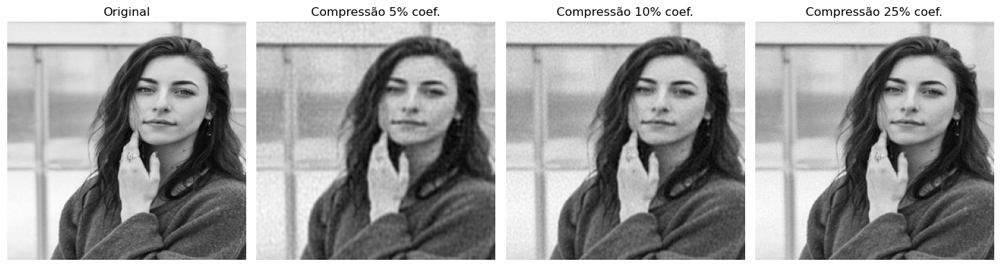

In [24]:
img = Image.open("imgs/humanBW.jpg").convert("L").resize((256, 256))
img = np.array(img, dtype=float) / 255.0

def dct2(a): return dct(dct(a.T, norm='ortho').T, norm='ortho')
def idct2(a): return idct(idct(a.T, norm='ortho').T, norm='ortho')

D = dct2(img)

ratios = [0.05, 0.1, 0.25]
recon = []

for r in ratios:
    cutoff = int(D.size * r)
    flat = np.abs(D).flatten()
    thresh = np.sort(flat)[-cutoff]
    D_low = D * (np.abs(D) >= thresh)
    recon.append(np.clip(idct2(D_low), 0, 1))

fig, axes = plt.subplots(1, 4, figsize=(14, 4))
axes[0].imshow(img, cmap="gray")
axes[0].set_title("Original")
axes[0].axis("off")

for ax, r, rec in zip(axes[1:], ratios, recon):
    ax.imshow(rec, cmap="gray")
    ax.set_title(f"Compressão {int(r*100)}% coef.")
    ax.axis("off")

plt.tight_layout()
plt.show()

## 2.24 Transformada de Fourier em imagens a cores

A **Transformada de Fourier** é naturalmente definida para sinais escalares — como a intensidade luminosa de uma imagem em tons de cinzento.  
Para imagens a cores, é necessário **tratar cada canal separadamente**, pois cada componente (R, G, B) possui o seu próprio conteúdo espectral.


### 2.24.1 Formulação matemática

Dada uma imagem RGB representada como três matrizes $f_R(x,y)$, $f_G(x,y)$ e $f_B(x,y)$, aplica-se a Transformada de Fourier bidimensional a cada uma:

$$
F_R(u,v) = \mathcal{F}\{f_R(x,y)\}, \quad
F_G(u,v) = \mathcal{F}\{f_G(x,y)\}, \quad
F_B(u,v) = \mathcal{F}\{f_B(x,y)\}.
$$

Cada espectro é complexo, podendo ser decomposto em **magnitude** e **fase**:

$$
F_C(u,v) = |F_C(u,v)| \, e^{j \phi_C(u,v)}, \quad C \in \{R,G,B\}.
$$

A magnitude indica a **energia das frequências** em cada canal, enquanto a fase codifica a **estrutura espacial** da informação de cor.


### 2.24.2 Descrição sequencial da operação

1. **Carregamento e normalização da imagem:**  
   A imagem é carregada em formato RGB e convertida para o intervalo [0, 1].

2. **Separação dos canais:**  
   Cada canal ($R$, $G$, $B$) é tratado como uma imagem independente.

3. **Cálculo da FFT bidimensional:**  
   Para cada canal, calcula-se a FFT 2D e aplica-se `fftshift()` para recentrar o espectro:
   $$
   F_C(u,v) = \text{fftshift}\left(\text{fft2}(f_C(x,y))\right)
   $$

4. **Cálculo da magnitude logarítmica:**  
   Para melhor visualização, aplica-se a escala logarítmica:
   $$
   M_C(u,v) = \log(1 + |F_C(u,v)|)
   $$

5. **Combinação visual dos espectros:**  
   As três magnitudes são empilhadas num tensor RGB:
   $$
   M_{\text{RGB}}(u,v) = [M_R(u,v), M_G(u,v), M_B(u,v)]
   $$
   Normaliza-se o resultado para [0,1], permitindo visualizar o **espectro combinado de cor**.

6. **Visualização:**  
   - Imagem original (espaço RGB).  
   - Espectro combinado de magnitude (representando a distribuição de energia nos três canais).


### 2.24.3 Interpretação e observações

- **Coerência entre canais:**  
  As estruturas principais (arestas, texturas) surgem em posições semelhantes nos três canais. Contudo, as diferenças de cor resultam em variações de energia entre os espectros $R$, $G$ e $B$.
- **Importância da separação:**  
  A FFT aplicada diretamente ao tensor RGB completo não tem significado físico — cada canal deve ser processado de forma independente, ou convertido para um espaço de cor com canal de luminância (como YCbCr).

- **Compressão e filtragem:**  
  - Em compressão (como JPEG), aplica-se DCT apenas à componente **luminância (Y)**, pois o olho humano é mais sensível a variações de brilho do que de cor.  
  - Em filtragem espectral, podem aplicar-se filtros diferentes por canal, preservando a coerência cromática.

- **Visualização do espectro:**  
  - As zonas centrais de $M_{\text{RGB}}$ correspondem às **baixas frequências** — gradientes suaves e iluminação global.  
  - As arestas representam **altas frequências** — contornos, texturas e ruído cromático.

> **Nota prática**  
> – Compare os espectros individuais de $R$, $G$ e $B$ — as variações revelam diferenças de cor na frequência.  
> – Experimente aplicar um filtro passa-baixo apenas ao canal $R$ e observe o impacto visual.  
> – Converta a imagem para YCbCr e repita a análise: a componente Y (luminância) domina o conteúdo estrutural.  
> – Visualize $|F_C|$ e $\phi_C$ em separado para compreender o papel da magnitude e da fase em cada canal.

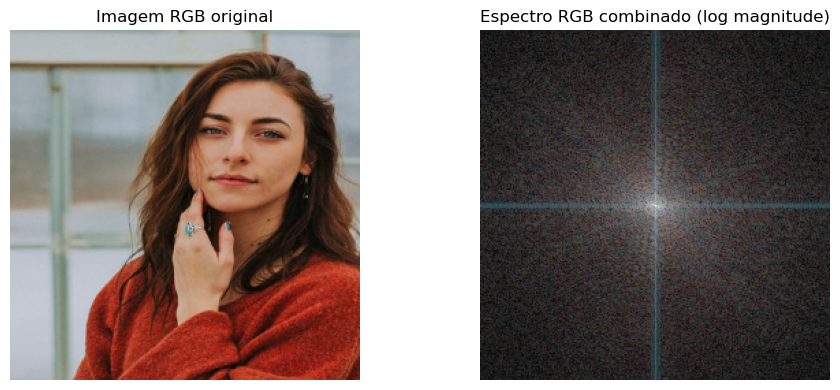

In [25]:
img_color = Image.open("imgs/human.jpg").resize((256, 256))
img_rgb = np.array(img_color, dtype=float) / 255.0

F_r = np.fft.fftshift(np.fft.fft2(img_rgb[..., 0]))
F_g = np.fft.fftshift(np.fft.fft2(img_rgb[..., 1]))
F_b = np.fft.fftshift(np.fft.fft2(img_rgb[..., 2]))

mag_r = np.log(1 + np.abs(F_r))
mag_g = np.log(1 + np.abs(F_g))
mag_b = np.log(1 + np.abs(F_b))

mag_rgb = np.stack((mag_r, mag_g, mag_b), axis=-1)
mag_rgb /= mag_rgb.max()

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(img_rgb)
axes[0].set_title("Imagem RGB original")
axes[0].axis("off")

axes[1].imshow(mag_rgb)
axes[1].set_title("Espectro RGB combinado (log magnitude)")
axes[1].axis("off")

plt.tight_layout()
plt.show()